In [1]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
Asset_PATH = "/home/zhimin90/DePaul/CSC695/Github/CSC695-Masters-Research-on-Neural-Network-Time-Series-Attention-Models/Asset/"

#### Load Gaussian KDE timeseries

In [3]:
density_matrix_t_series = pickle.load(open(Asset_PATH  + 'density_matrix_t_series_100x100.pickle', 'rb'))

In [4]:
density_matrix_t_series.shape

(198, 100, 100)

In [5]:
print(np.max(density_matrix_t_series))
print(np.min(density_matrix_t_series))

2019.7794007598727
-2.393156546274511e-13


In [6]:
density_matrix_t_series.shape[0]

198

In [7]:
timesteps = 52

In [8]:
train, valid = (60,20)
test = 20

total_len = density_matrix_t_series.shape[0] - timesteps
train_index = range(0,int(train/100*total_len))

valid_index = range(train_index[-1]+1,train_index[-1] + int(valid/100*total_len))
test_index = range(valid_index[-1]+1,valid_index[-1] + int(test/100*total_len))

In [9]:
flattened_matrix_np = np.reshape(density_matrix_t_series, 
                                 (density_matrix_t_series.shape[0],
                                  density_matrix_t_series.shape[1]*density_matrix_t_series.shape[2]))
flattened_matrix_np.shape

(198, 10000)

In [10]:
np.max(flattened_matrix_np[train_index])

1935.6194220503628

In [11]:
scaler_max = np.max(flattened_matrix_np[train_index])
scaler_min = np.min(flattened_matrix_np[train_index])

X_train = (flattened_matrix_np[train_index] - scaler_min)/(scaler_max - scaler_min)


In [12]:
X_train = X_train.reshape(X_train.shape[0],
                          1,    
                          X_train.shape[1])
X_train.shape

(87, 1, 10000)

In [13]:
X_train = X_train.reshape(X_train.shape[0],X_train.shape[1],int(X_train.shape[2]**(1/2)),int(X_train.shape[2]**(1/2)),1)
X_train.shape

(87, 1, 100, 100, 1)

In [14]:
print(np.max(X_train))
print(np.min(X_train))

1.0
0.0


#### We transform the whole train, valid, test based on scaler fitted on train

In [15]:
np.max(flattened_matrix_np)

2019.7794007598727

In [16]:
flattened_matrix_np.dtype

dtype('float64')

In [17]:
scaled_flattened_matrix = (flattened_matrix_np - scaler_min)/(scaler_max - scaler_min)

In [18]:
flattened_matrix_np.shape

(198, 10000)

In [19]:
scaled_flattened_matrix.shape

(198, 10000)

In [20]:
print(np.max(scaled_flattened_matrix))
print(np.min(scaled_flattened_matrix))

1.0434796105839654
-3.2227207716804404e-17


In [21]:
scaled_flattened_matrix.shape

(198, 10000)

In [22]:
def window_stack(a, stepsize=1, width=52):
    n = a.shape[0]
    return np.hstack( a[i:1+n+i-width:stepsize] for i in range(0,width) )

In [23]:
stacked = window_stack(scaled_flattened_matrix,1,timesteps)

/home/zhimin90/anaconda3/envs/venv/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  This is separate from the ipykernel package so we can avoid doing imports until


In [24]:
stacked.shape

(147, 520000)

In [25]:
reshape_stack = stacked.reshape(stacked.shape[0],timesteps,
                                int((stacked.shape[1]/timesteps)**(1/2)),
                                int((stacked.shape[1]/timesteps)**(1/2)),1)

In [26]:
reshape_stack.shape

(147, 52, 100, 100, 1)

#### We reshape to (sample, timestep, inputshape)

In [27]:
scaled_flattened_matrix = reshape_stack
scaled_flattened_matrix.shape

(147, 52, 100, 100, 1)

In [28]:
train, valid = (60,20)
test = 20

total_len = scaled_flattened_matrix.shape[0]
train_index = range(0,int(train/100*total_len))

valid_index = range(train_index[-1]+1,train_index[-1] + int(valid/100*total_len))
test_index = range(valid_index[-1]+1,valid_index[-1] + int(test/100*total_len))

#### We set the target to be 7 days aggregated KDE or 1 single frame forward

In [29]:
X_train = scaled_flattened_matrix[np.array(train_index)]
Y_train = scaled_flattened_matrix[np.array(train_index)+1][:,-1,:]
Y_train = Y_train.reshape(Y_train.shape[0],int(Y_train.shape[1]*Y_train.shape[2]*Y_train.shape[3]))

In [30]:
X_valid = scaled_flattened_matrix[np.array(valid_index)]
Y_valid = scaled_flattened_matrix[np.array(valid_index)+1][:,-1,:]
Y_valid = Y_valid.reshape(Y_valid.shape[0],int(Y_valid.shape[1]*Y_valid.shape[2]*Y_valid.shape[3]))

In [31]:
X_test = scaled_flattened_matrix[np.array(test_index)]
Y_test = scaled_flattened_matrix[np.array(test_index)+1][:,-1,:]
Y_test = Y_test.reshape(Y_test.shape[0],int(Y_test.shape[1]*Y_test.shape[2]*Y_test.shape[3]))

In [32]:
print(X_train.shape)
print(Y_train.shape)
print(X_valid.shape)
print(Y_valid.shape)
print(X_test.shape)
print(Y_test.shape)

(88, 52, 100, 100, 1)
(88, 10000)
(28, 52, 100, 100, 1)
(28, 10000)
(28, 52, 100, 100, 1)
(28, 10000)


In [33]:
import os, datetime
import tensorflow as tf
from tensorflow.keras import optimizers
import tensorflow.keras.layers as layers
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, LSTM, Bidirectional, GaussianNoise, Flatten
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Concatenate, Input, LSTM, GRU, RepeatVector, TimeDistributed
from tensorflow.keras.layers import concatenate, Activation, Permute, Multiply, Lambda, Reshape, LeakyReLU


In [34]:
checkpoint_filepath = Asset_PATH+'checkpoints/'
print(checkpoint_filepath)

/home/zhimin90/DePaul/CSC695/Github/CSC695-Masters-Research-on-Neural-Network-Time-Series-Attention-Models/Asset/checkpoints/


## Flattened Fully Connected Model

In [35]:
serie_size, time_step, n_features_row, n_features_column, no_channel = X_train.shape

lr = .0001
loss='mae'
METRIC_ACCURACY = 'mae'

inputs = Input(shape=(time_step,n_features_row, n_features_column, no_channel))
   
timeDist = TimeDistributed(Flatten())(inputs)

Dense1 = Dense(50, kernel_initializer='glorot_normal', activation='relu')(timeDist)
Dense2 = Dense(Y_train.shape[1])(Flatten()(Dense1))
outputs = Dense2

model = Model(inputs, outputs, name="Flattened_Fully_Connected")
model.summary()

adam = optimizers.Adam(lr)
model.compile(loss='mean_absolute_error',
                   metrics=['mae'], 
                   optimizer=adam)


Model: "Flattened_Fully_Connected"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 26, 100, 100, 1)] 0         
_________________________________________________________________
time_distributed (TimeDistri (None, 26, 10000)         0         
_________________________________________________________________
dense (Dense)                (None, 26, 50)            500050    
_________________________________________________________________
flatten_1 (Flatten)          (None, 1300)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 10000)             13010000  
Total params: 13,510,050
Trainable params: 13,510,050
Non-trainable params: 0
_________________________________________________________________


## Flattened LSTM Model

In [ ]:
serie_size, time_step, n_features_row, n_features_column, no_channel = X_train.shape

lr = .0001
loss='mae'
METRIC_ACCURACY = 'mae'

inputs = Input(shape=(time_step,n_features_row, n_features_column, no_channel))

    
timeDist = TimeDistributed(Flatten())(inputs)

LSTM_layer1 = LSTM(100)(timeDist)
Dense1 = Dense(100, kernel_initializer='glorot_normal', activation='relu')(LSTM_layer1)
Dense2 = Dense(Y_train.shape[1])(Flatten()(Dense1))
outputs = Dense2

model = Model(inputs, outputs, name="Flattened_LTSM")
model.summary()

adam = optimizers.Adam(lr)
model.compile(loss='mean_absolute_error',
                   metrics=['mae'], 
                   optimizer=adam)



## 2D CNN LSTM model

In [ ]:
serie_size, time_step, n_features_row, n_features_column, no_channel = X_train.shape

epochs = 100
batch = 48
lr = .0001
loss='mae'
METRIC_ACCURACY = 'mae'

inputs = Input(shape=(time_step,n_features_row, n_features_column, no_channel))

cnn1 = Conv2D(20, (1,1), activation='relu', padding='same')
TD = TimeDistributed(cnn1)(inputs)

cnn2 = Conv2D(20, (1,1), activation='relu', padding='same')
TD2 = TimeDistributed(cnn2)(TD)

TD3 = TimeDistributed(
        MaxPooling2D(pool_size=(2, 2)))(TD2)
    
timeDist = TimeDistributed(Flatten())(TD3)

cnn4 = Conv2D(20, (1,1), activation='relu', padding='same')
TD4 = TimeDistributed(cnn4)(TD3)

cnn5 = Conv2D(20, (1,1), activation='relu', padding='same')
TD5 = TimeDistributed(cnn5)(TD4)

TD6 = TimeDistributed(
        MaxPooling2D(pool_size=(2, 2)))(TD5)
    
timeDist2 = TimeDistributed(Flatten())(TD6)

merge = concatenate([timeDist, timeDist2])

LSTM_layer1 = LSTM(50)(merge)
Dense1 = Dense(100, kernel_initializer='glorot_normal', activation='relu')(LSTM_layer1)
Dense2 = Dense(Y_train.shape[1])(Flatten()(Dense1))
outputs = Dense2

model = Model(inputs, outputs, name="2DCNN_LTSM")
model.summary()

adam = optimizers.Adam(lr)
model.compile(loss='mean_absolute_error',
                   metrics=['mae'], 
                   optimizer=adam)



## 2D CNN with LSTM + Attention

In [ ]:
from tensorflow.keras import backend as K

In [ ]:
serie_size, time_step, n_features_row, n_features_column, no_channel = X_train.shape

epochs = 100
lr = .0001
loss='mae'
METRIC_ACCURACY = 'mae'


inputs = Input(shape=(time_step,n_features_row, n_features_column, no_channel))

cnn1 = Conv2D(10, (1,1), activation='relu', padding='same')
TD = TimeDistributed(cnn1)(inputs)

cnn2 = Conv2D(10, (1,1), activation='relu', padding='same')
TD2 = TimeDistributed(cnn2)(TD)

TD3 = TimeDistributed(
        MaxPooling2D(pool_size=(2, 2)))(TD2)
    
timeDist = TimeDistributed(Flatten())(TD3)

'''
#Paralell 2D CNN layer
cnn4 = Conv2D(20, (1,1), activation='relu', padding='same')
TD4 = TimeDistributed(cnn4)(TD3)

cnn5 = Conv2D(20, (1,1), activation='relu', padding='same')
TD5 = TimeDistributed(cnn5)(TD4)

TD6 = TimeDistributed(
        MaxPooling2D(pool_size=(2, 2)))(TD5)
    
timeDist2 = TimeDistributed(Flatten())(TD6)

merge = concatenate([timeDist, timeDist2])
'''

#send both convolved layer and flattened layer into LSTM
#merge = concatenate([timeDist, timeDist3])

units = 100
LSTM_layer1 = LSTM(units, return_sequences=True)(timeDist)

# compute importance for each step
attention = Dense(units, activation='tanh')(LSTM_layer1) ## weight matrix W (= units x units)
attention = Dense(1, activation='linear')(attention)     ## weight matrix v (= units x 1)

#attention = Dense(1, activation='tanh')(LSTM_layer1)
attention = Flatten()(attention)
attention = Activation('softmax')(attention)
attention = RepeatVector(units)(attention)
attention = Permute([2, 1])(attention)

print("attention shape", attention.shape)
print("LSTM_layer1 shape", LSTM_layer1.shape)
sent_representation = Multiply()([LSTM_layer1, attention])

print("sent_representation shape", sent_representation.shape)
#same shape as LSTM output (None,52,100)

#attended_LSTM_out = Lambda(lambda x : K.sum(x, axis=1))(sent_representation) ## this line
#For each timestep update a single weight on Dense layer
#Adding a time distributed dense layer instead of previously commented out line of summing 
#over time axis dramatically increased mae by .0002-3 consistently with different models.
attended_LSTM_out = TimeDistributed(Dense(3, activation='relu'))(sent_representation)

#Flatten time dimension
Dense2 = Dense(Y_train.shape[1])(Flatten()(attended_LSTM_out))
outputs = Dense2

model = Model(inputs, outputs, name="2DCNN_LTSM_Attention")
model.summary()

adam = optimizers.Adam(lr)
model.compile(loss='mean_absolute_error',
                   metrics=['mae'], 
                   optimizer=adam)


## Flattened LSTM + Attention

In [35]:
from tensorflow.keras import backend as K

In [138]:
serie_size, time_step, n_features_row, n_features_column, no_channel = X_train.shape

epochs = 100
lr = .0001
loss='mae'
METRIC_ACCURACY = 'mae'


inputs = Input(shape=(time_step,n_features_row, n_features_column, no_channel))

#send both convolved layer and flattened layer into LSTM
timeDist3 = TimeDistributed(Flatten())(inputs)
#merge = concatenate([timeDist, timeDist3])

units = 100
LSTM_layer1 = LSTM(units, return_sequences=True)(timeDist3)

# compute importance for each step
attention = Dense(units, activation='tanh')(LSTM_layer1) ## weight matrix W (= units x units)
attention = Dense(1, activation='linear')(attention)     ## weight matrix v (= units x 1)

#attention = Dense(1, activation='tanh')(LSTM_layer1)
attention = Flatten()(attention)
attention = Activation('softmax',name='attention_weights')(attention)
attention = RepeatVector(units)(attention)
attention = Permute([2, 1])(attention)

print("attention shape", attention.shape)
print("LSTM_layer1 shape", LSTM_layer1.shape)
sent_representation = Multiply()([LSTM_layer1, attention])

print("sent_representation shape", sent_representation.shape)
#same shape as LSTM output (None,52,100)

#attended_LSTM_out = Lambda(lambda x : K.sum(x, axis=1))(sent_representation) ## this line
#D_temp = Dense(units*2, activation='relu')(attended_LSTM_out) # hidden layer
#For each timestep update a single weight on Dense layer
#Adding a time distributed dense layer instead of previously commented out line of summing 
#over time axis dramatically increased mae by .0002-3 consistently with different models.
attended_LSTM_out = TimeDistributed(Dense(3, activation='relu'))(sent_representation) 

#Flatten time dimension
Dense2 = Dense(Y_train.shape[1])(Flatten()(attended_LSTM_out))
outputs = Dense2

model = Model(inputs, outputs, name="FLATTENED_LTSM_Attention")
model.summary()

adam = optimizers.Adam(lr)
model.compile(loss='mean_absolute_error',
                   metrics=['mae'], 
                   optimizer=adam)


attention shape (None, 52, 100)
LSTM_layer1 shape (None, 52, 100)
sent_representation shape (None, 52, 100)
Model: "FLATTENED_LTSM_Attention"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_21 (InputLayer)           [(None, 52, 100, 100 0                                            
__________________________________________________________________________________________________
time_distributed_58 (TimeDistri (None, 52, 10000)    0           input_21[0][0]                   
__________________________________________________________________________________________________
lstm_1 (LSTM)                   (None, 52, 100)      4040400     time_distributed_58[0][0]        
__________________________________________________________________________________________________
dense_96 (Dense)                (None, 52, 100)      10100       l

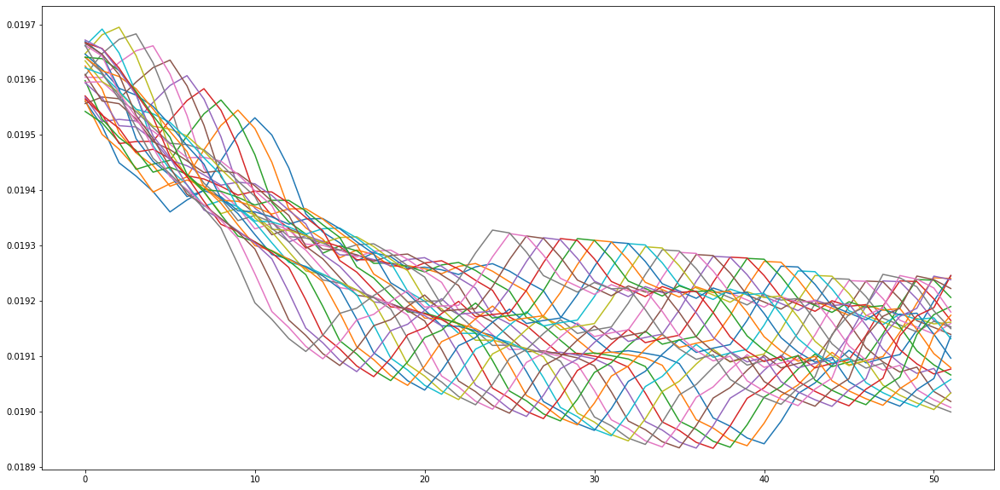

In [141]:
model_AttentionOut = model  # include here your original model

layer_name = 'attention_weights'
intermediate_layer_model = Model(inputs=model_AttentionOut.input,
                                 outputs=model_AttentionOut.get_layer(layer_name).output)
plt.figure(figsize=(20,10))
for timeStepWeek in range(X_valid.shape[0]):
    intermediate_output = intermediate_layer_model.predict(X_valid[timeStepWeek:timeStepWeek+1])
    plt.plot(intermediate_output[0])
    #plt.show()

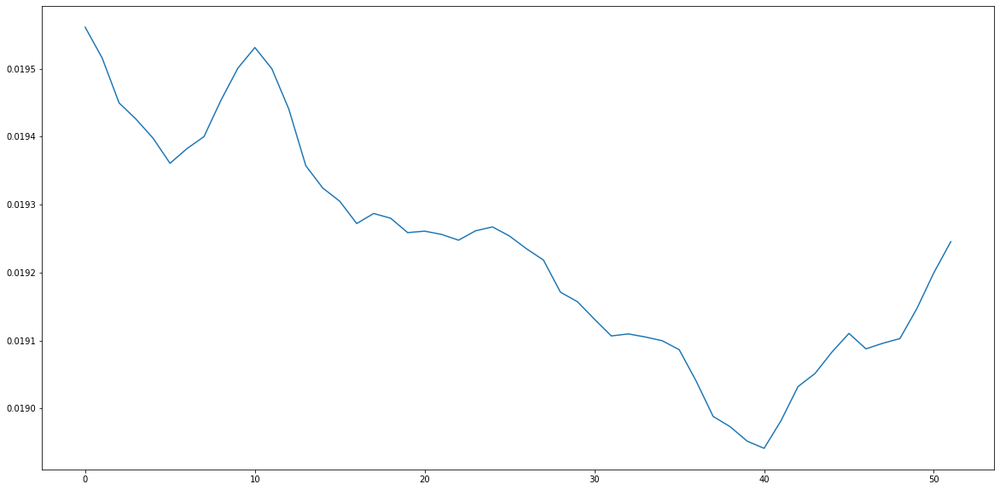

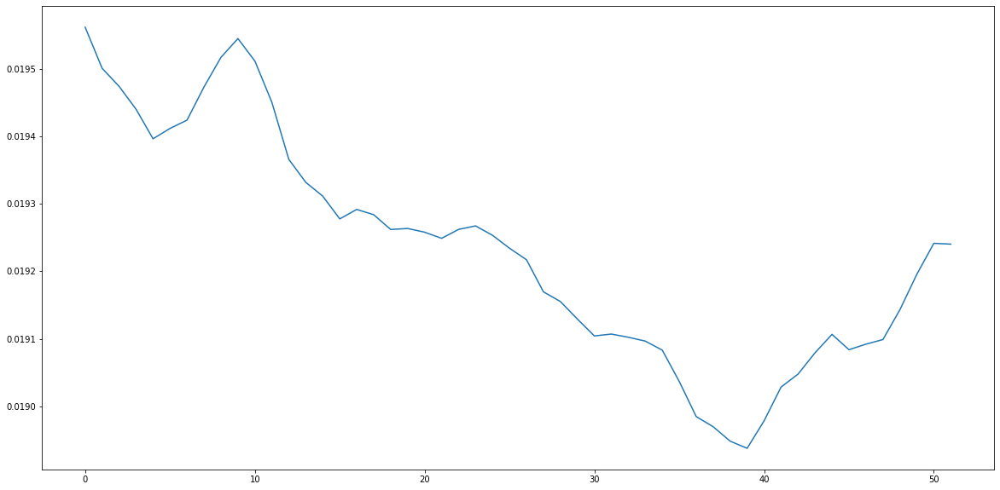

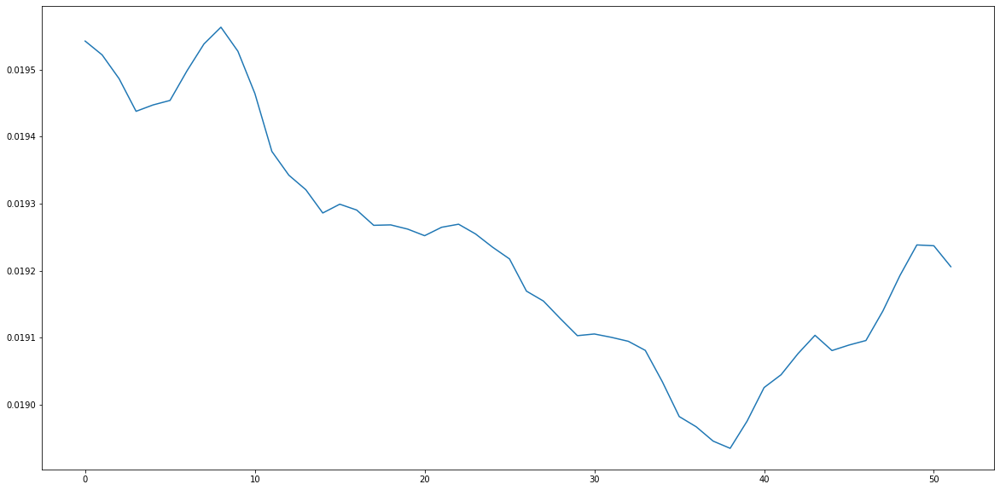

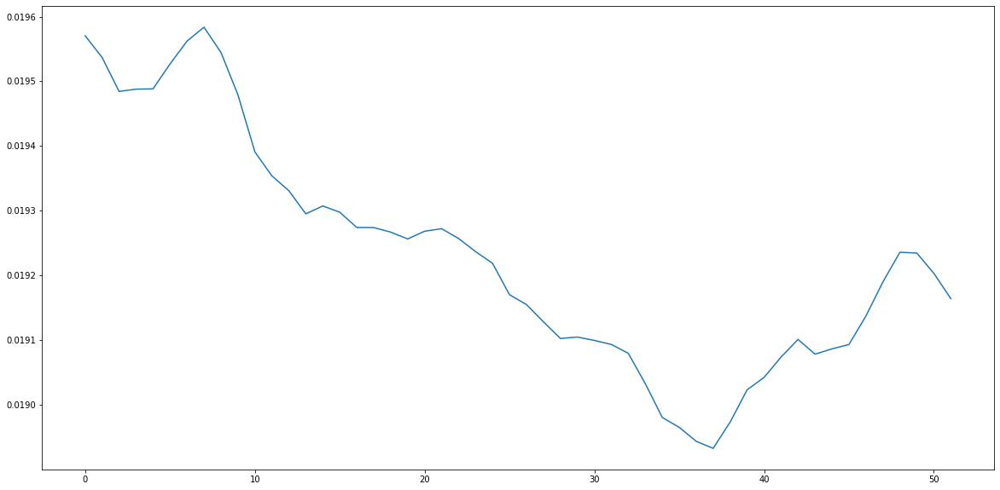

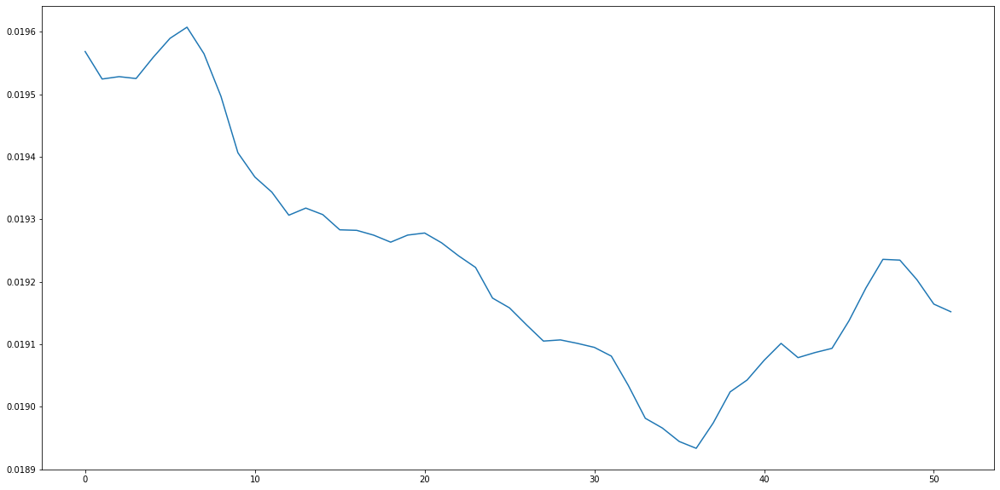

...

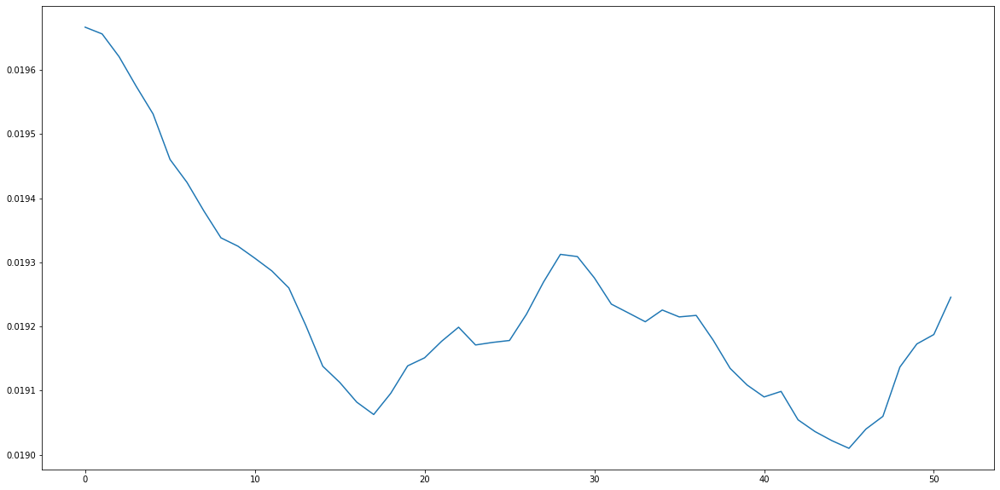

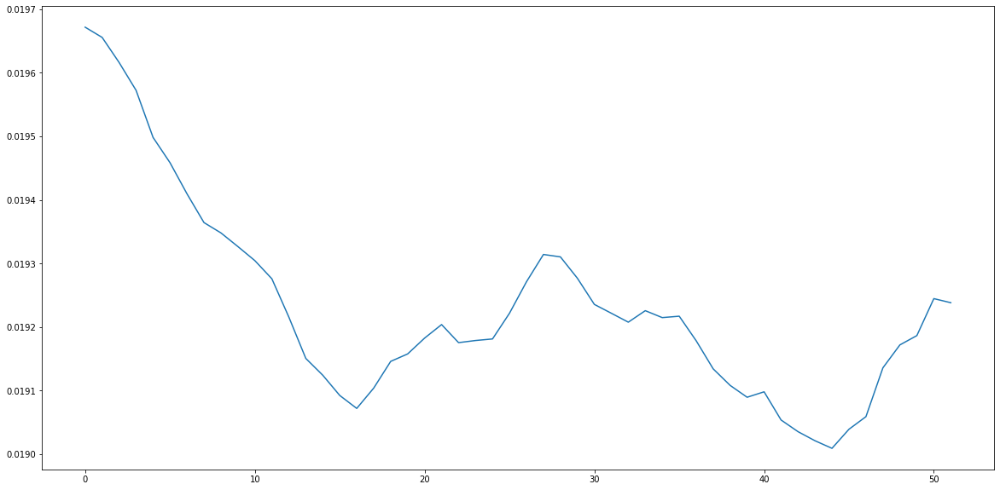

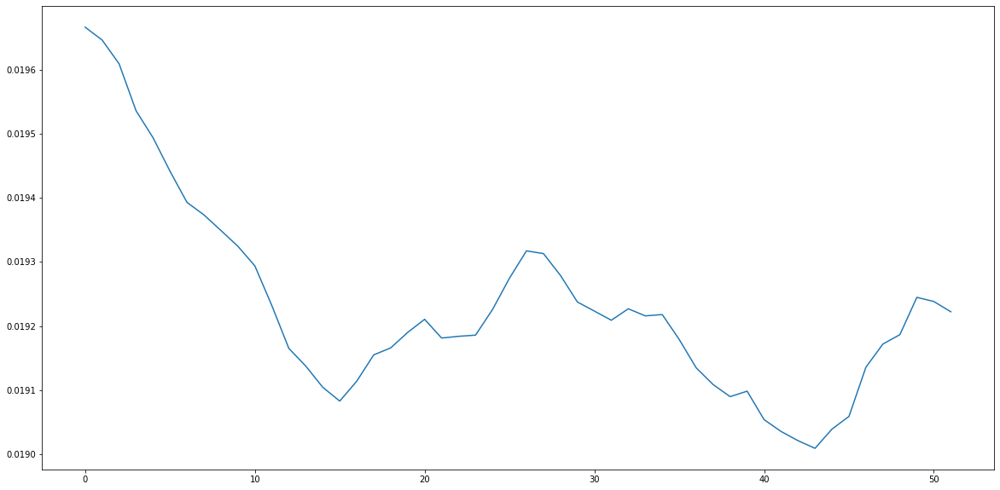

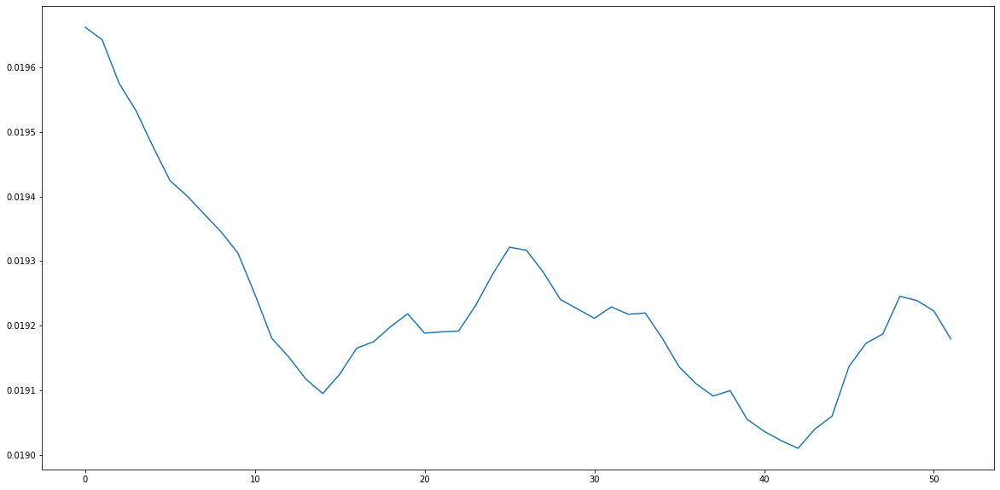

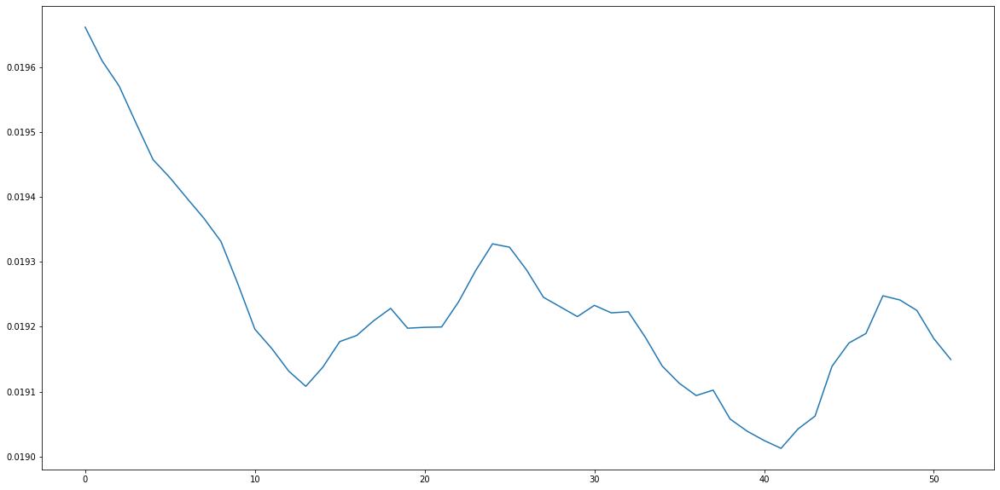

In [142]:
for timeStepWeek in range(X_valid.shape[0]):
    plt.figure(figsize=(20,10))
    intermediate_output = intermediate_layer_model.predict(X_valid[timeStepWeek:timeStepWeek+1])
    plt.plot(intermediate_output[0])
    plt.show()

#### We can see in each recurrence of the LSTM, the hidden state sequence thru time step. The state if the LSTM is shifting out with each timestep or recurrence. Attention to the critical recurrences moves with time step.

## Attention on flattened inputs

In [132]:
serie_size, time_step, n_features_row, n_features_column, no_channel = X_train.shape

epochs = 100
lr = .0001
loss='mae'
METRIC_ACCURACY = 'mae'


inputs = Input(shape=(time_step,n_features_row, n_features_column, no_channel))

timeDist = TimeDistributed(Flatten())(inputs)
timeDist2 = TimeDistributed(Dense(25))(timeDist)
units = timeDist2.shape[2]
# compute importance for each step
attention = Dense(units, activation='tanh')(timeDist2) ## weight matrix W (= units x units)
attention = Dense(1, activation='linear')(attention)     ## weight matrix v (= units x 1)
#attention = Dense(1, activation='tanh')(timeDist2)
print('attention.shape: ', attention.shape)
attention = Flatten()(attention)
attention = Activation('softmax',name='attention_weights')(attention)
attention = RepeatVector(units)(attention)
attention = Permute([2, 1])(attention)
sent_representation = Multiply()([timeDist2, attention])
#For each timestep update a single weight on Dense layer
attended_Dense_out = TimeDistributed(Dense(1, activation='relu'))(sent_representation)

#Flatten time dimension
Dense2 = Dense(Y_train.shape[1])(Flatten()(attended_Dense_out))
outputs = Dense2

model = Model(inputs, outputs, name="Flattened_Attention_Time")
model.summary()

adam = optimizers.Adam(lr)
model.compile(loss='mean_absolute_error',
                   metrics=['mae'], 
                   optimizer=adam)


attention.shape:  (None, 52, 1)
Model: "Flattened_Attention_Time"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_20 (InputLayer)           [(None, 52, 100, 100 0                                            
__________________________________________________________________________________________________
time_distributed_55 (TimeDistri (None, 52, 10000)    0           input_20[0][0]                   
__________________________________________________________________________________________________
time_distributed_56 (TimeDistri (None, 52, 25)       250025      time_distributed_55[0][0]        
__________________________________________________________________________________________________
dense_92 (Dense)                (None, 52, 25)       650         time_distributed_56[0][0]        
___________________________________________

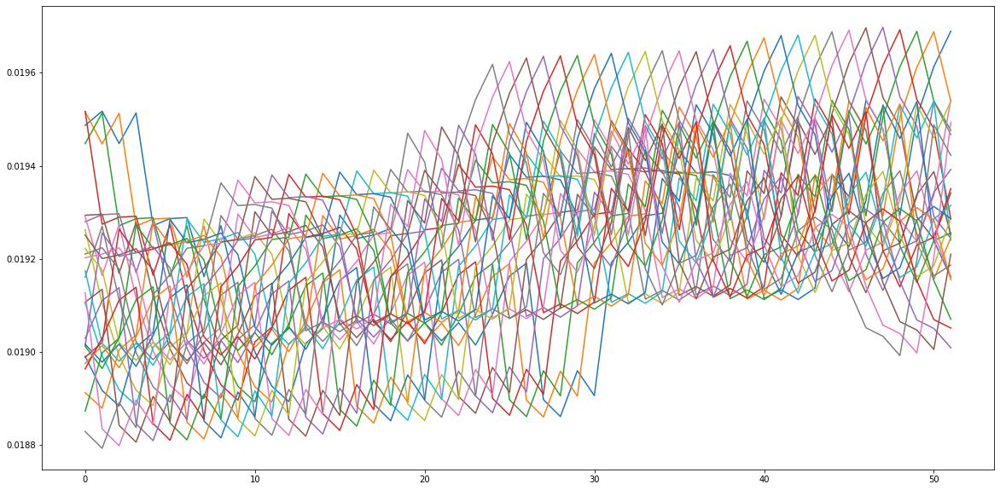

In [47]:
model_AttentionOut = model  # include here your original model

layer_name = 'attention_weights'
intermediate_layer_model = Model(inputs=model_AttentionOut.input,
                                 outputs=model_AttentionOut.get_layer(layer_name).output)
plt.figure(figsize=(20,10))
for timeStepWeek in range(X_valid.shape[0]):
    intermediate_output = intermediate_layer_model.predict(X_valid[timeStepWeek:timeStepWeek+1])
    plt.plot(intermediate_output[0])
    #plt.show()

## 2xAttention on flattened inputs

In [48]:
serie_size, time_step, n_features_row, n_features_column, no_channel = X_train.shape

epochs = 100
lr = .0001
loss='mae'
METRIC_ACCURACY = 'mae'


inputs = Input(shape=(time_step,n_features_row, n_features_column, no_channel))

timeDist = TimeDistributed(Flatten())(inputs)
timeDist2 = TimeDistributed(Dense(25))(timeDist)
units = timeDist2.shape[2]
# compute importance for each step
attention = Dense(units, activation='tanh')(timeDist2) ## weight matrix W (= units x units)
attention = Dense(1, activation='linear')(attention)     ## weight matrix v (= units x 1)
#attention = Dense(1, activation='tanh')(timeDist2)
print('attention.shape: ', attention.shape)
attention = Flatten()(attention)
attention = Activation('softmax',name='attention1_weights')(attention)
attention = RepeatVector(units)(attention)
attention = Permute([2, 1])(attention)
sent_representation = Multiply()([timeDist2, attention])
#For each timestep update a single weight on Dense layer
attended_Dense_out = TimeDistributed(Dense(1, activation='relu'))(sent_representation)

timeDist3 = TimeDistributed(Flatten())(inputs)
timeDist4 = TimeDistributed(Dense(25))(timeDist3)
units = timeDist4.shape[2]
# compute importance for each step
attention2 = Dense(units, activation='tanh')(timeDist4) ## weight matrix W (= units x units)
attention2 = Dense(1, activation='linear')(attention2)     ## weight matrix v (= units x 1)
#attention2 = Dense(1, activation='tanh')(timeDist4)
attention2 = Flatten()(attention2)
attention2 = Activation('softmax',name='attention2_weights')(attention2)
attention2 = RepeatVector(units)(attention2)
attention2 = Permute([2, 1])(attention2)
sent_representation2 = Multiply()([timeDist4, attention2])
#For each timestep update a single weight on Dense layer
attended_Dense_out2 = TimeDistributed(Dense(1, activation='relu'))(sent_representation2)
'''
timeDist5 = TimeDistributed(Flatten())(inputs)
timeDist6 = TimeDistributed(Dense(20))(timeDist5)
units = timeDist6.shape[2]
# compute importance for each step
attention3 = Dense(1, activation='tanh')(timeDist6)
attention3 = Flatten()(attention3)
attention3 = Activation('softmax')(attention3)
attention3 = RepeatVector(units)(attention3)
attention3 = Permute([2, 1])(attention3)
sent_representation3 = Multiply()([timeDist6, attention3])
#For each timestep update a single weight on Dense layer
attended_Dense_out3 = TimeDistributed(Dense(1, activation='relu'))(sent_representation3)
'''
merge = concatenate([attended_Dense_out, attended_Dense_out2])

#Flatten time dimension
Dense2 = Dense(Y_train.shape[1])(Flatten()(merge))
outputs = Dense2

model = Model(inputs, outputs, name="2xAttention_Time")
model.summary()

adam = optimizers.Adam(lr)
model.compile(loss='mean_absolute_error',
                   metrics=['mae'], 
                   optimizer=adam)


attention.shape:  (None, 52, 1)
Model: "2xAttention_Time"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            [(None, 52, 100, 100 0                                            
__________________________________________________________________________________________________
time_distributed_17 (TimeDistri (None, 52, 10000)    0           input_6[0][0]                    
__________________________________________________________________________________________________
time_distributed_20 (TimeDistri (None, 52, 10000)    0           input_6[0][0]                    
__________________________________________________________________________________________________
time_distributed_18 (TimeDistri (None, 52, 25)       250025      time_distributed_17[0][0]        
___________________________________________________

In [190]:
model_AttentionOut = model  # include here your original model

layer_name = 'attention1_weights'
intermediate_layer_model = Model(inputs=model_AttentionOut.input,
                                 outputs=model_AttentionOut.get_layer(layer_name).output)
intermediate_output = intermediate_layer_model.predict(X_valid[0:1])

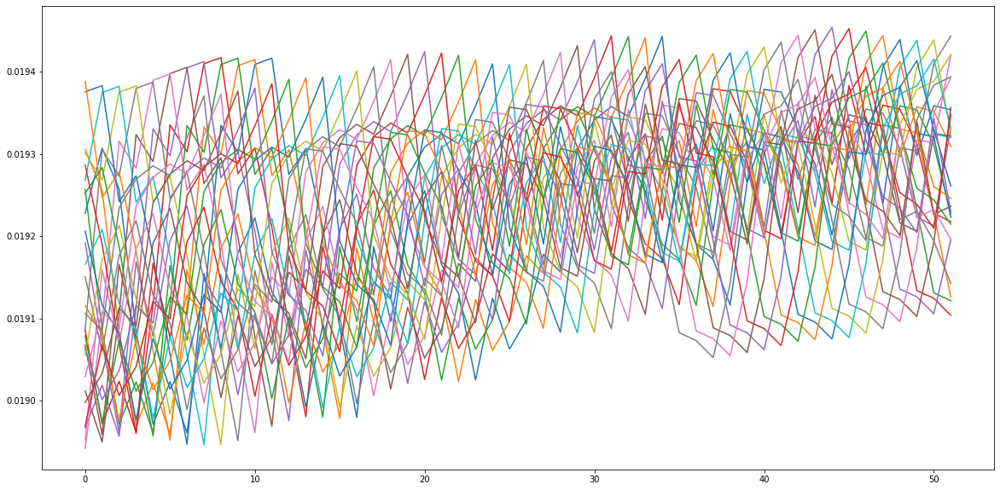

In [195]:
plt.figure(figsize=(20,10))
for timeStepWeek in range(X_valid.shape[0]):
    intermediate_output = intermediate_layer_model.predict(X_valid[timeStepWeek:timeStepWeek+1])
    plt.plot(intermediate_output[0])
    #plt.show()

In [196]:
model_AttentionOut = model  # include here your original model

layer_name = 'attention2_weights'
intermediate_layer_model = Model(inputs=model_AttentionOut.input,
                                 outputs=model_AttentionOut.get_layer(layer_name).output)
intermediate_output = intermediate_layer_model.predict(X_valid[0:1])

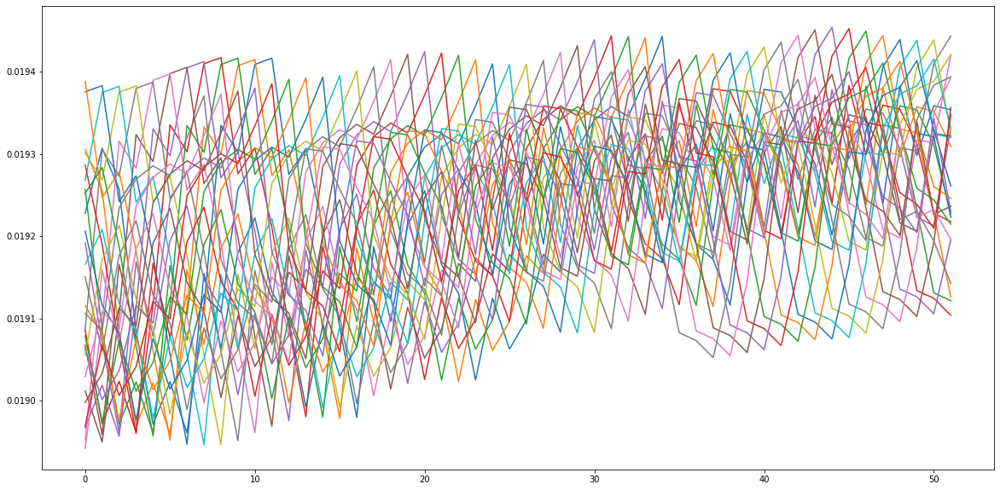

In [198]:
plt.figure(figsize=(20,10))
for timeStepWeek in range(X_valid.shape[0]):
    intermediate_output = intermediate_layer_model.predict(X_valid[timeStepWeek:timeStepWeek+1])
    plt.plot(intermediate_output[0])
    #plt.show()

#### We see attention shift forward with the target time which increments every 7 days per time step. This means days of the year is more important to regression.

#### Next we plot the attention in increasing time order

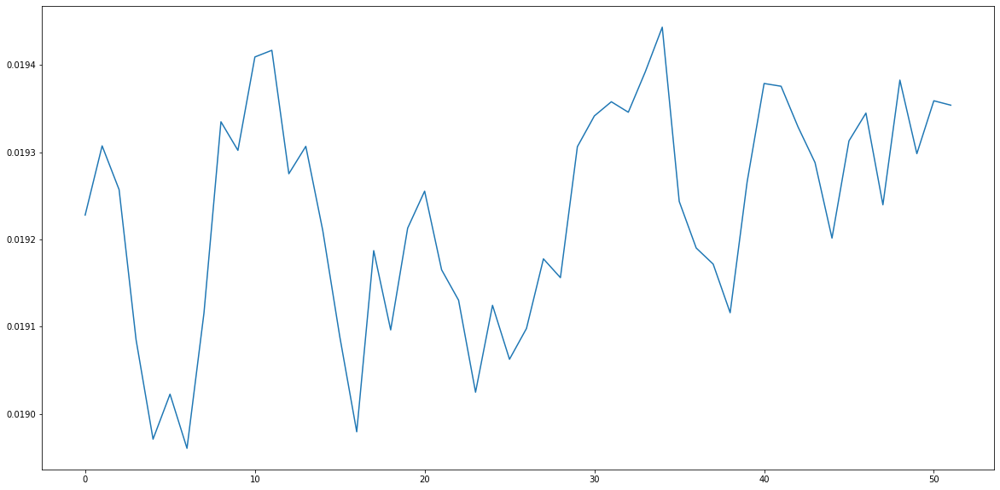

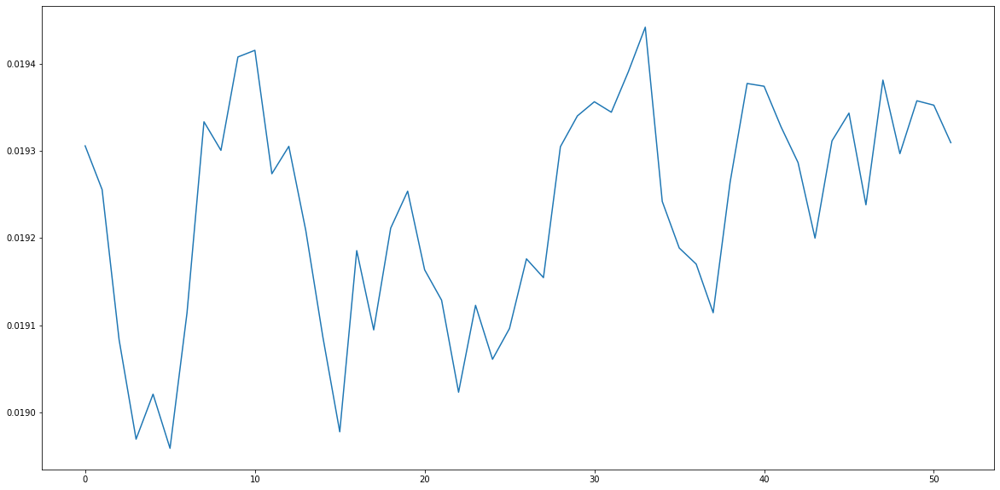

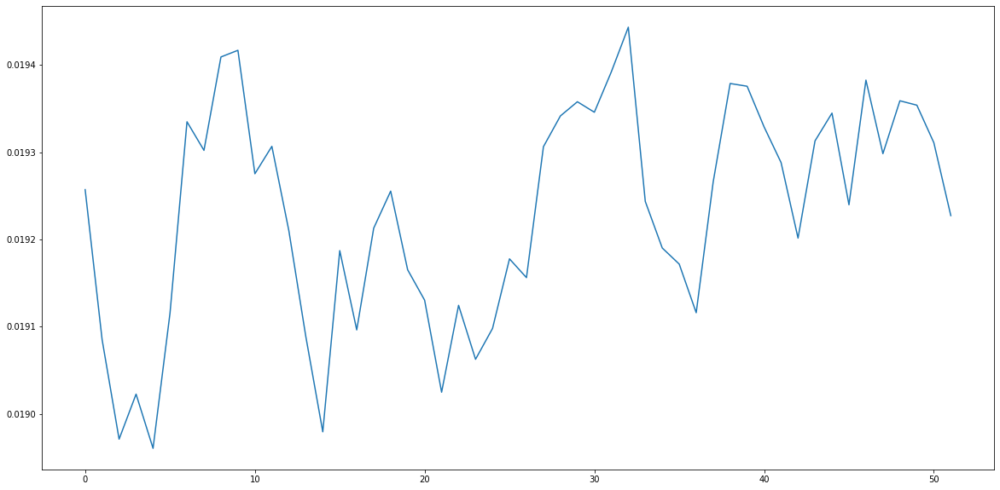

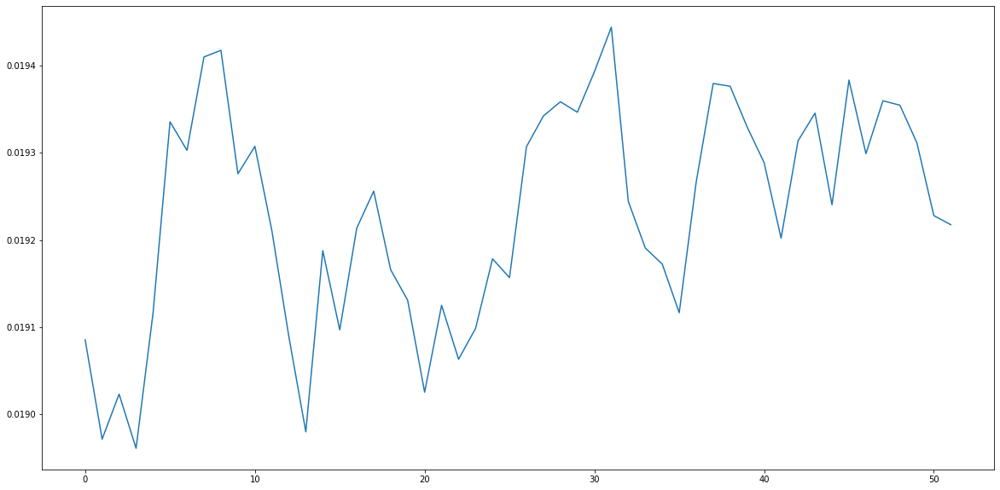

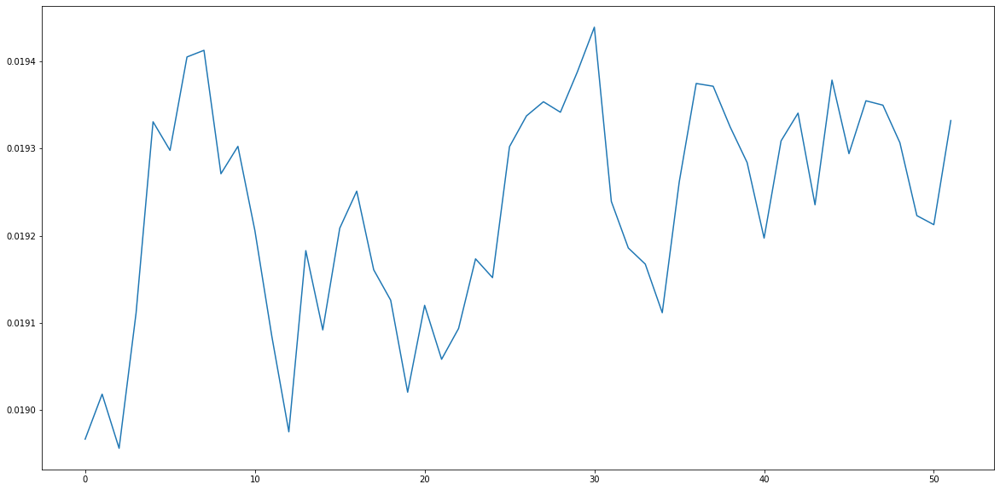

...

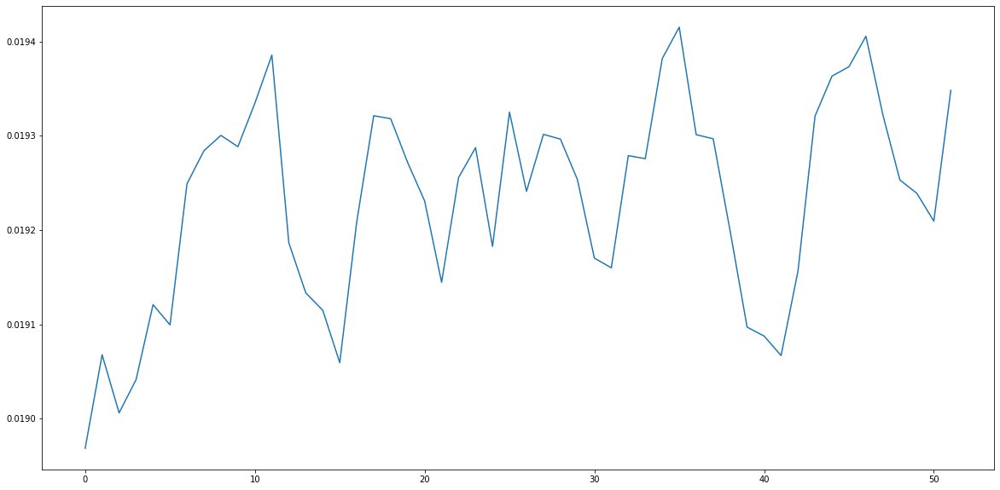

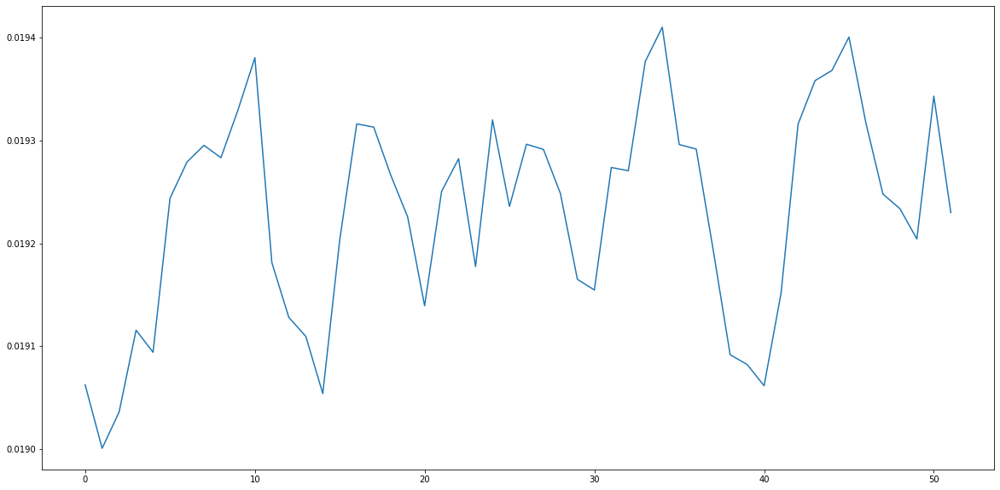

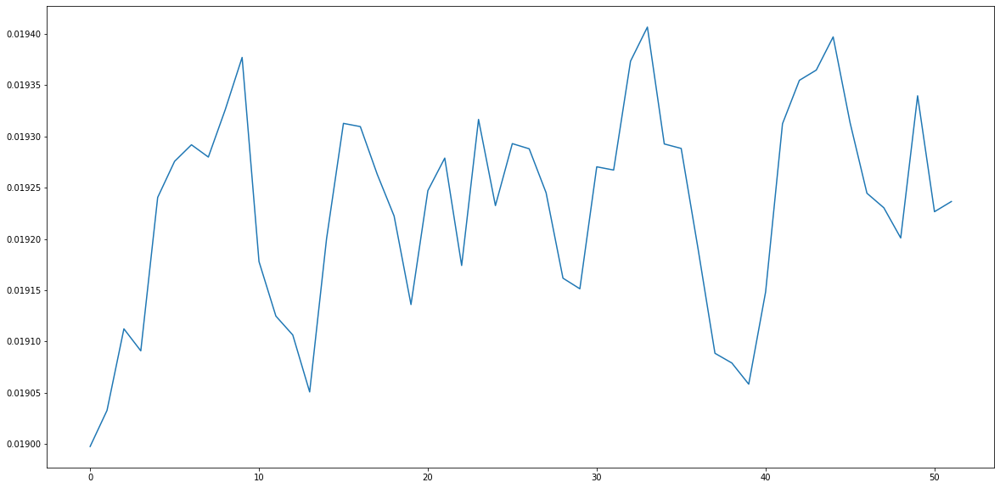

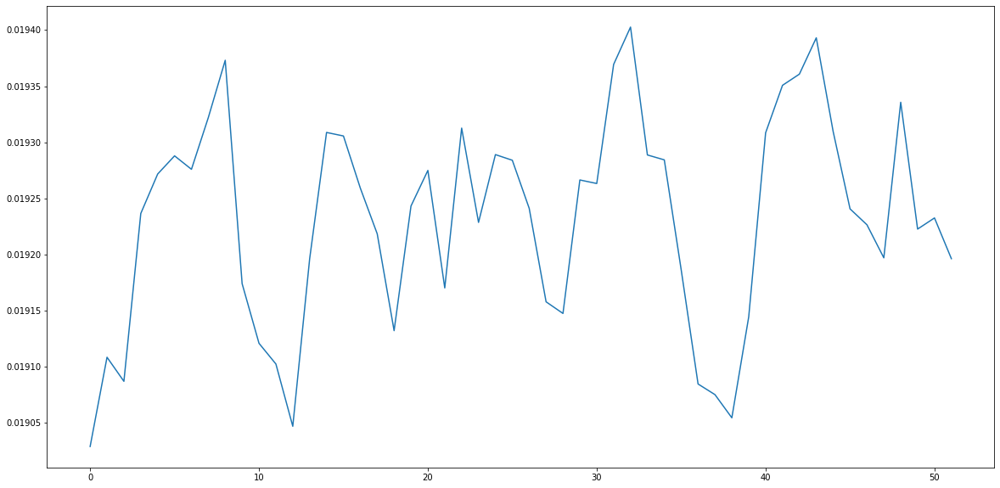

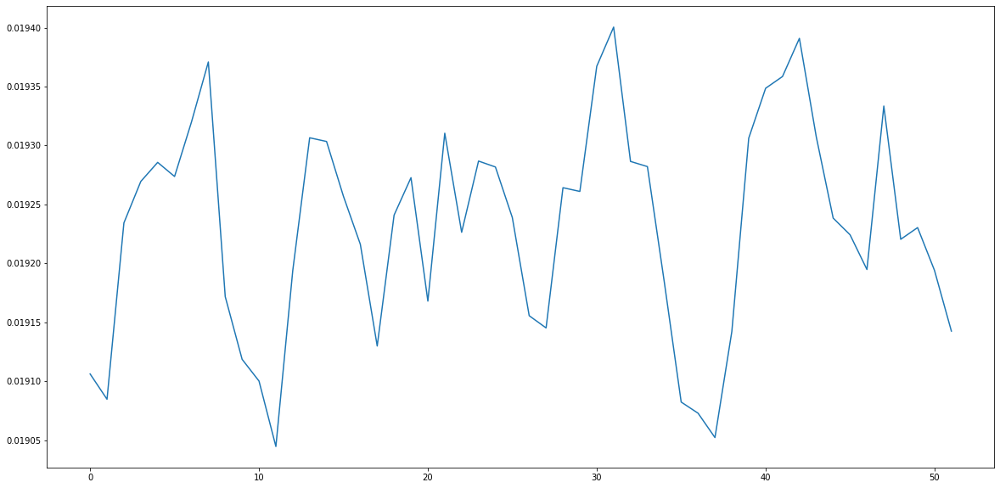

In [200]:
for timeStepWeek in range(X_valid.shape[0]):
    plt.figure(figsize=(20,10))
    intermediate_output = intermediate_layer_model.predict(X_valid[timeStepWeek:timeStepWeek+1])
    plt.plot(intermediate_output[0])
    plt.show()

#### The above plot clearly show that attention is a time invariant. Peaks of the attention are sliding back as we travel forward in time. This means, certain days of the year(or seasonally) is more important to the prediction than others.

## Frequency from FFT + Attention

In [35]:
serie_size, time_step, n_features_row, n_features_column, no_channel = X_train.shape

epochs = 100
lr = .0001
loss='mae'
METRIC_ACCURACY = 'mae'


inputs = Input(shape=(time_step,n_features_row, n_features_column, no_channel))

#Frequency Head
timeDist = TimeDistributed(Flatten())(inputs)
timeDist = Permute([2, 1])(timeDist) #transpose for FFT. FFT library treats the last dimension as time
print('timeDist.shape',timeDist.shape)
fftLayer = Lambda(lambda x : tf.math.abs(tf.signal.rfft(x)))(timeDist) ## transform to frequency domain with TF
fftLayer  = Permute([2, 1], name="fft_out")(fftLayer)#transpose back for the following shape
print('fftLayer.shape',fftLayer.shape)  
#(None,num_of_frequencies,num_of_features)
#compress frequency domain data from 10000 to downsized dimension for attention
#Time distributed is now frequency distributed
timeDist4 = TimeDistributed(Dense(100))(fftLayer)
units = timeDist4.shape[2]

# compute importance for each frequency
attention = Dense(units, activation='tanh')(timeDist4) ## weight matrix W (= units x units)
attention = Dense(1, activation='linear')(attention)     ## weight matrix v (= units x 1)
#attention = Dense(1, activation='tanh')(timeDist4)
attention = Flatten()(attention)
attention = Activation('softmax',name='attention_weights')(attention)
attention = RepeatVector(units)(attention)
attention = Permute([2, 1])(attention)
sent_representation2 = Multiply()([timeDist4, attention])
#For each timestep update a single weight on Dense layer
attended_Dense_out2 = TimeDistributed(Dense(3, activation='relu'))(sent_representation2)
#attended_Dense_out2 = Lambda(lambda x : K.sum(x, axis=1))(sent_representation2) ## this line

#print('attended_Dense_out',attended_Dense_out.shape[1])
#max_len = attended_Dense_out.shape[1]
#pad1 = tf.constant([[0, max_len-attended_Dense_out2.shape[1]]])

#attended_Dense_out2 = tf.pad(attended_Dense_out2, pad1, mode='CONSTANT')

#merge = concatenate([attended_Dense_out, attended_Dense_out2], axis=1)

#Flatten time dimension
Dense2 = Dense(Y_train.shape[1])(Flatten()(attended_Dense_out2))
outputs = Dense2

model = Model(inputs, outputs, name="Attention_FFT")
model.summary()

adam = optimizers.Adam(lr)
#rmsProp = optimizers.RMSprop(learning_rate=lr)
model.compile(loss='mean_absolute_error',
                   metrics=['mae'], 
                   optimizer=adam)


timeDist.shape (None, 10000, 52)
fftLayer.shape (None, 27, 10000)
Model: "Attention_FFT"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 52, 100, 100 0                                            
__________________________________________________________________________________________________
time_distributed (TimeDistribut (None, 52, 10000)    0           input_1[0][0]                    
__________________________________________________________________________________________________
permute (Permute)               (None, 10000, 52)    0           time_distributed[0][0]           
__________________________________________________________________________________________________
lambda (Lambda)                 (None, 10000, 27)    0           permute[0][0]                    
____________________

#### Get intermediate layer out

In [48]:
X_train[0:7].shape

(7, 52, 100, 100, 1)

In [49]:
from tensorflow.keras.models import Model

model_fft = model  # include here your original model

layer_name = 'fft_out'
intermediate_layer_model = Model(inputs=model_fft.input,
                                 outputs=model_fft.get_layer(layer_name).output)
intermediate_output = intermediate_layer_model.predict(X_train[0:1])

In [50]:
intermediate_output.shape

(1, 27, 10000)

In [51]:
intermediate_output.reshape(27,100,100)[0]

array([[4.8661615e-15, 4.7382799e-15, 4.7273273e-15, ..., 4.8901164e-15,
        4.9585131e-15, 4.9108103e-15],
       [4.8435826e-15, 4.7496458e-15, 4.7766094e-15, ..., 4.9872936e-15,
        4.9781600e-15, 4.9095025e-15],
       [4.9729381e-15, 4.9150306e-15, 4.8405858e-15, ..., 4.9483589e-15,
        4.9508724e-15, 4.8679271e-15],
       ...,
       [4.7367976e-15, 4.6725217e-15, 4.7282730e-15, ..., 5.0313617e-15,
        4.9527558e-15, 4.9926561e-15],
       [4.6194348e-15, 4.6351320e-15, 4.6546951e-15, ..., 4.8703869e-15,
        4.9264059e-15, 4.8226918e-15],
       [4.5454930e-15, 4.6580226e-15, 4.6198092e-15, ..., 4.7662641e-15,
        4.7993984e-15, 4.7794647e-15]], dtype=float32)

#### Plot of the lowest frequency at 1Hz

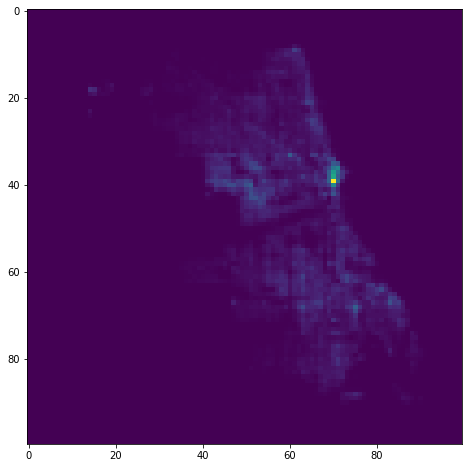

In [52]:
plt.figure(figsize=(12,8))
plt.imshow(np.rot90(intermediate_output.reshape(27,100,100)[0]))

In [53]:
firstPixelFreqDomain =  intermediate_output[0,:,0]

<BarContainer object of 27 artists>

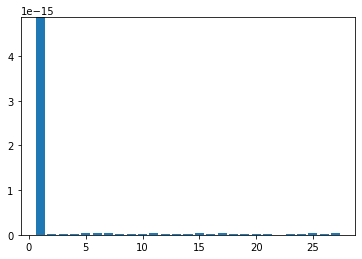

In [54]:
plt.bar(range(1,firstPixelFreqDomain.shape[0]+1),firstPixelFreqDomain)

In [55]:
np.rot90(intermediate_output.reshape(27,100,100)[0,:,:]).shape

(100, 100)

/home/zhimin90/anaconda3/envs/venv/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<Figure size 720x1440 with 0 Axes>

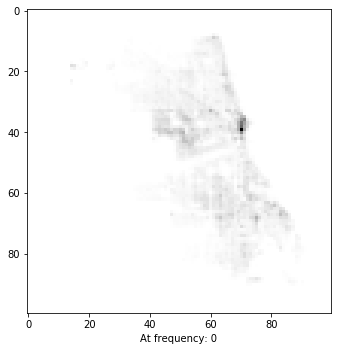

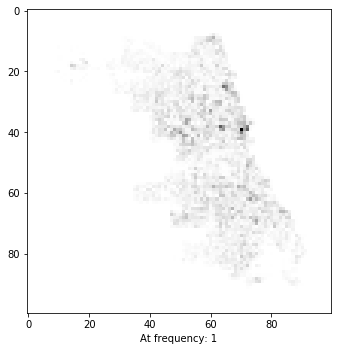

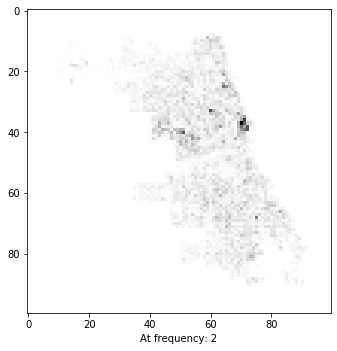

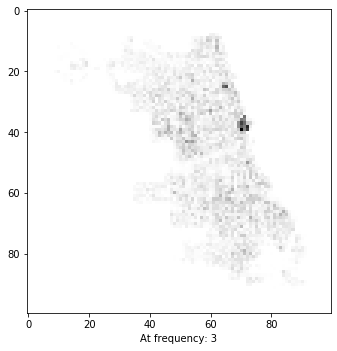

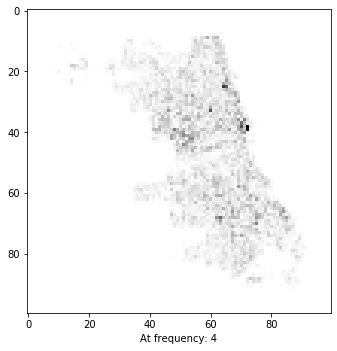

...

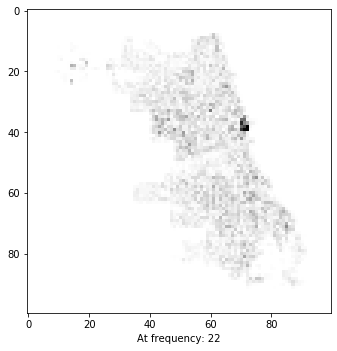

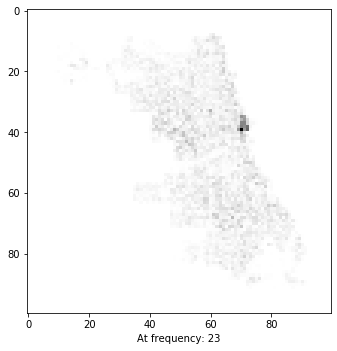

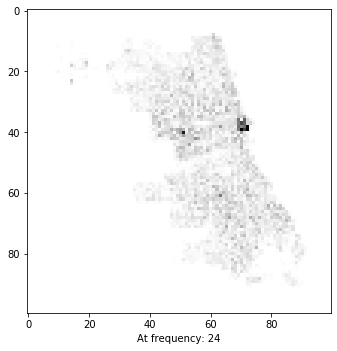

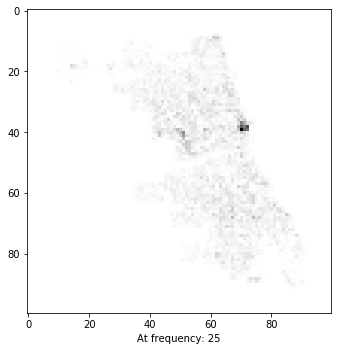

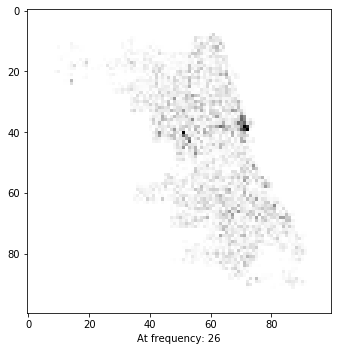

In [70]:
plt.figure(figsize=(10,20))
for i in range(27):
    plt.figure(figsize=(200,200))
    plt.subplot(30,1,i+1)
    #plt.xticks([])
    #plt.yticks([])
    #plt.grid(True)
    plt.imshow(np.rot90(intermediate_output.reshape(27,100,100)[i]), cmap=plt.cm.binary)
    plt.xlabel("At frequency: "+ str(i))
plt.show()

In [71]:
firstPixelTimeDomain = X_train[0,:,0,0,0]
firstPixelTimeDomain.shape

(52,)

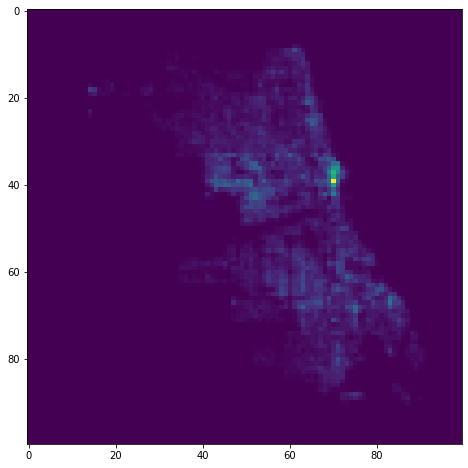

In [72]:
plt.figure(figsize=(12,8))
plt.imshow(np.rot90(X_train[0,0,:,:,0]))

<BarContainer object of 52 artists>

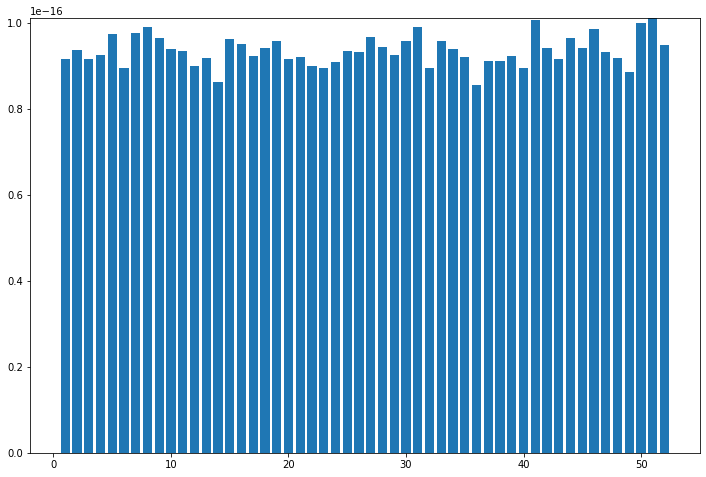

In [73]:
plt.figure(figsize=(12,8))
plt.bar(range(1,firstPixelTimeDomain.shape[0]+1),firstPixelTimeDomain)

In [98]:
model_AttentionOut = model  # include here your original model

layer_name = 'attention_weights'
intermediate_layer_model = Model(inputs=model_AttentionOut.input,
                                 outputs=model_AttentionOut.get_layer(layer_name).output)


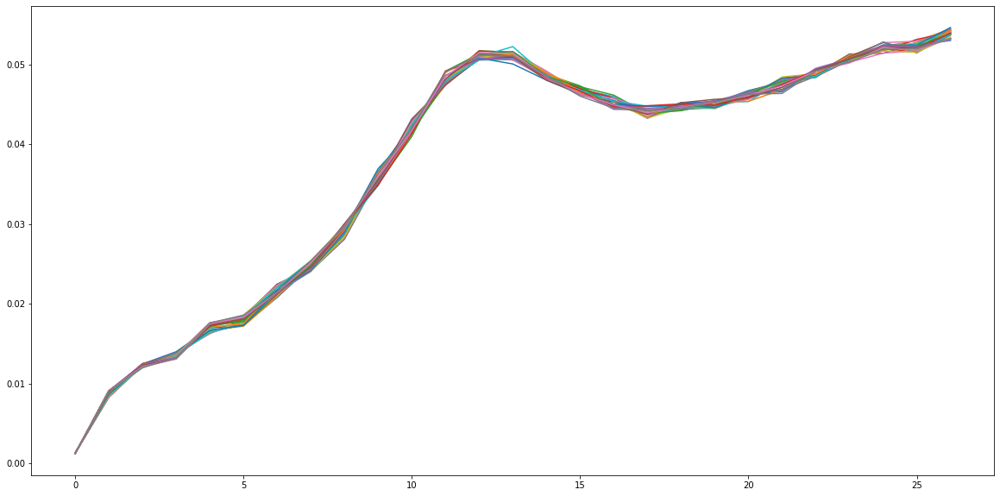

In [99]:
plt.figure(figsize=(20,10))
for timeStepWeek in range(X_valid.shape[0]):
    intermediate_output = intermediate_layer_model.predict(X_train[timeStepWeek:timeStepWeek+1])
    plt.plot(intermediate_output[0])
    #plt.show()

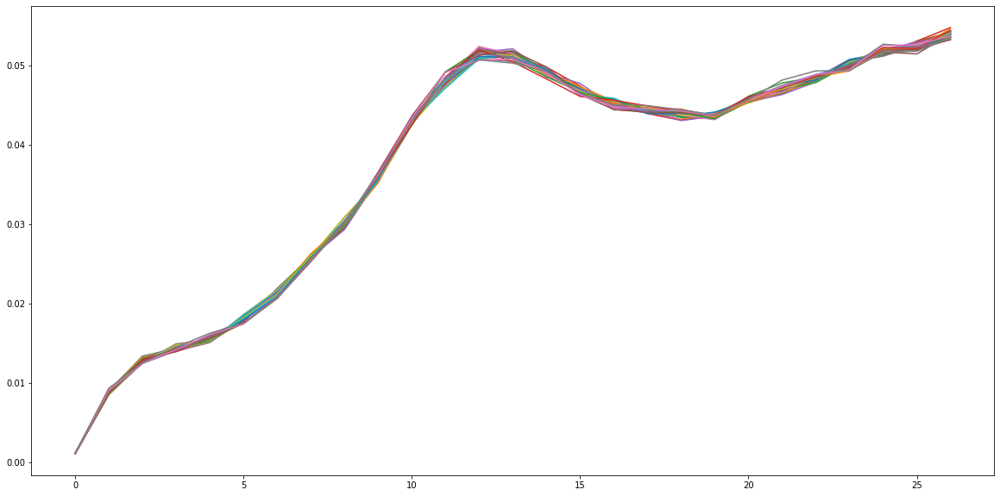

In [100]:
plt.figure(figsize=(20,10))
for timeStepWeek in range(X_valid.shape[0]):
    intermediate_output = intermediate_layer_model.predict(X_valid[timeStepWeek:timeStepWeek+1])
    plt.plot(intermediate_output[0])
    #plt.show()

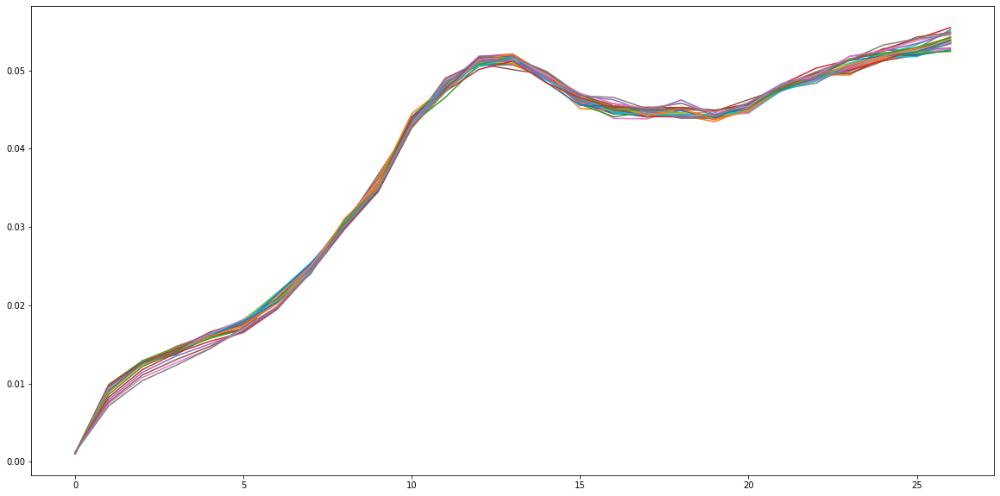

In [101]:
plt.figure(figsize=(20,10))
for timeStepWeek in range(X_valid.shape[0]):
    intermediate_output = intermediate_layer_model.predict(X_test[timeStepWeek:timeStepWeek+1])
    plt.plot(intermediate_output[0])
    #plt.show()

#### We see that the attention is similarly distributed for each frequency thru out 28 weeks in the validation set. This is similar to auto correlation as the attention is frequecy domain which shows which period of the 52 weeks the model attend to for optimal prediction. In this case, the model is a attending to 12 period. Each period is time step of 7 days which makes the every 84 days cycle and also 27 * 7 which is 189 day cycle most important. This also means short term data does not get attended to for 7 day forecast regression.

#### Compared with time domain attention model, we see the attention to period is fairly constant. This validate the idea of attention looks at seasonal patterns similar to ARIMA model.

#### We see the model pays little to no attention to lowfrequencies. We can explorer this further by dropping these low frequency components

## FFT + Attention + Low Freq filtered

In [92]:
serie_size, time_step, n_features_row, n_features_column, no_channel = X_train.shape

epochs = 100
lr = .0001
loss='mae'
METRIC_ACCURACY = 'mae'


inputs = Input(shape=(time_step,n_features_row, n_features_column, no_channel))

#Frequency Head
timeDist = TimeDistributed(Flatten())(inputs)
timeDist = Permute([2, 1])(timeDist) #transpose for FFT. FFT library treats the last dimension as time
print('timeDist.shape',timeDist.shape)
fftLayer = Lambda(lambda x : tf.math.abs(tf.signal.rfft(x)))(timeDist) ## transform to frequency domain with TF
fftLayer  = Permute([2, 1], name="fft_out")(fftLayer)#transpose back for the following shape
fftLayer = fftLayer[:,1:,:] #remove the first 2 freq
print('fftLayer.shape',fftLayer.shape)  
#(None,num_of_frequencies,num_of_features)
#compress frequency domain data from 10000 to downsized dimension for attention
#Time distributed is now frequency distributed
timeDist4 = TimeDistributed(Dense(100))(fftLayer)
units = timeDist4.shape[2]

# compute importance for each frequency
attention = Dense(units, activation='tanh')(timeDist4) ## weight matrix W (= units x units)
attention = Dense(1, activation='linear')(attention)     ## weight matrix v (= units x 1)
#attention = Dense(1, activation='tanh')(timeDist4)
attention = Flatten()(attention)
attention = Activation('softmax',name='attention_weights')(attention)
attention = RepeatVector(units)(attention)
attention = Permute([2, 1])(attention)
sent_representation2 = Multiply()([timeDist4, attention])
#For each timestep update a single weight on Dense layer
attended_Dense_out2 = TimeDistributed(Dense(3, activation='relu'))(sent_representation2)
#attended_Dense_out2 = Lambda(lambda x : K.sum(x, axis=1))(sent_representation2) ## this line

#print('attended_Dense_out',attended_Dense_out.shape[1])
#max_len = attended_Dense_out.shape[1]
#pad1 = tf.constant([[0, max_len-attended_Dense_out2.shape[1]]])

#attended_Dense_out2 = tf.pad(attended_Dense_out2, pad1, mode='CONSTANT')

#merge = concatenate([attended_Dense_out, attended_Dense_out2], axis=1)

#Flatten time dimension
Dense2 = Dense(Y_train.shape[1])(Flatten()(attended_Dense_out2))
outputs = Dense2

model = Model(inputs, outputs, name="Attention_FFT_DroplowFreq")
model.summary()

adam = optimizers.Adam(lr)
#rmsProp = optimizers.RMSprop(learning_rate=lr)
model.compile(loss='mean_absolute_error',
                   metrics=['mae'], 
                   optimizer=adam)


timeDist.shape (None, 10000, 52)
fftLayer.shape (None, 26, 10000)
Model: "Attention_FFT_DroplowFreq"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_10 (InputLayer)           [(None, 52, 100, 100 0                                            
__________________________________________________________________________________________________
time_distributed_26 (TimeDistri (None, 52, 10000)    0           input_10[0][0]                   
__________________________________________________________________________________________________
permute_16 (Permute)            (None, 10000, 52)    0           time_distributed_26[0][0]        
__________________________________________________________________________________________________
lambda_7 (Lambda)               (None, 10000, 27)    0           permute_16[0][0]                 
________

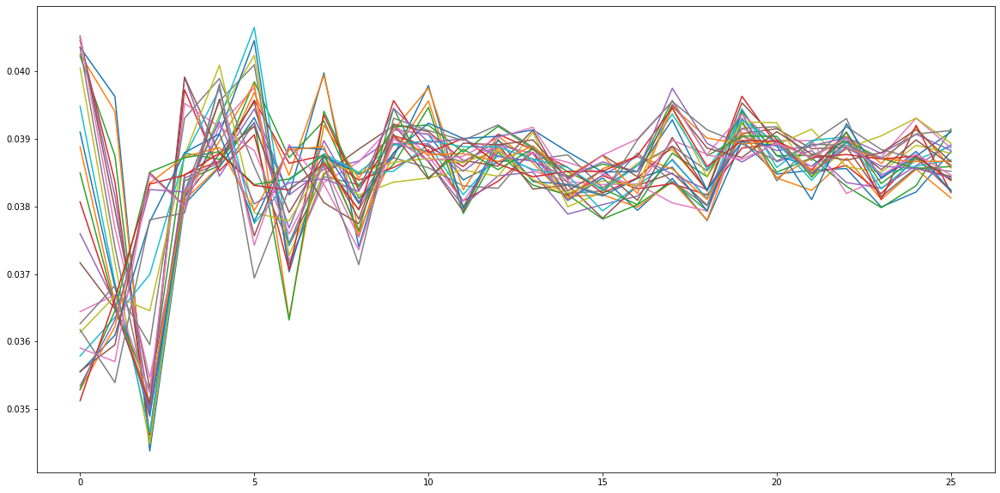

In [86]:
model_AttentionOut = model  # include here your original model

layer_name = 'attention_weights'
intermediate_layer_model = Model(inputs=model_AttentionOut.input,
                                 outputs=model_AttentionOut.get_layer(layer_name).output)
plt.figure(figsize=(20,10))
for timeStepWeek in range(X_valid.shape[0]):
    intermediate_output = intermediate_layer_model.predict(X_valid[timeStepWeek:timeStepWeek+1])
    plt.plot(intermediate_output[0])
    #plt.show()

#### We note here when attention is used on frequency domain, all attentions coverges. This may simply mean that attention may not be necessary since all queries are identical.

## FFT + Dense Layer out

In [39]:
serie_size, time_step, n_features_row, n_features_column, no_channel = X_train.shape

epochs = 100
lr = .0001
loss='mae'
METRIC_ACCURACY = 'mae'


inputs = Input(shape=(time_step,n_features_row, n_features_column, no_channel))

#Frequency Head
timeDist = TimeDistributed(Flatten())(inputs)
timeDist = Permute([2, 1])(timeDist) #transpose for FFT. FFT library treats the last dimension as time
print('timeDist.shape',timeDist.shape)
fftLayer = Lambda(lambda x : tf.math.abs(tf.signal.rfft(x)))(timeDist) ## transform to frequency domain with TF
fftLayer  = Permute([2, 1], name="fft_out")(fftLayer)#transpose back for the following shape
print('fftLayer.shape',fftLayer.shape)  
#(None,num_of_frequencies,num_of_features)
#compress frequency domain data from 10000 to downsized dimension for attention
#Time distributed is now frequency distributed
timeDist4 = TimeDistributed(Dense(100))(fftLayer)
units = timeDist4.shape[2]

Dense_out2 = TimeDistributed(Dense(3, activation='relu'))(timeDist4)

#Flatten time dimension
Dense2 = Dense(Y_train.shape[1])(Flatten()(Dense_out2))
outputs = Dense2

model = Model(inputs, outputs, name="Attention_FFT")
model.summary()

adam = optimizers.Adam(lr)
#rmsProp = optimizers.RMSprop(learning_rate=lr)
model.compile(loss='mean_absolute_error',
                   metrics=['mae'], 
                   optimizer=adam)


timeDist.shape (None, 10000, 52)
fftLayer.shape (None, 27, 10000)
Model: "Attention_FFT"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 52, 100, 100, 1)] 0         
_________________________________________________________________
time_distributed_3 (TimeDist (None, 52, 10000)         0         
_________________________________________________________________
permute_2 (Permute)          (None, 10000, 52)         0         
_________________________________________________________________
lambda_1 (Lambda)            (None, 10000, 27)         0         
_________________________________________________________________
fft_out (Permute)            (None, 27, 10000)         0         
_________________________________________________________________
time_distributed_4 (TimeDist (None, 27, 100)           1000100   
_____________________________________________________

#### FFT + Attention vs FFT + Dense layer out have identical MAE. This proves attention is not needed for frequency domain data.

## FFT + 2 head Attention(Time,Freq)

In [65]:
serie_size, time_step, n_features_row, n_features_column, no_channel = X_train.shape

epochs = 100
lr = .0001
loss='mae'
METRIC_ACCURACY = 'mae'


inputs = Input(shape=(time_step,n_features_row, n_features_column, no_channel))

#Time Head
timeDist = TimeDistributed(Flatten())(inputs)
timeDist2 = TimeDistributed(Dense(100))(timeDist)
units = timeDist2.shape[2]
# compute importance for each step
attention = Dense(units, activation='tanh')(timeDist2) ## weight matrix W (= units x units)
attention = Dense(1, activation='linear')(attention)     ## weight matrix v (= units x 1)
#attention = Dense(1, activation='tanh')(timeDist2)
print('attention.shape: ', attention.shape)
attention = Flatten()(attention)
attention = Activation('softmax',name='attentionTime_weights')(attention)
attention = RepeatVector(units)(attention)
attention = Permute([2, 1])(attention)
sent_representation = Multiply()([timeDist2, attention])
#For each timestep update a single weight on Dense layer
attended_Dense_out = TimeDistributed(Dense(3, activation='relu'))(sent_representation)
#attended_Dense_out = Lambda(lambda x : K.sum(x, axis=1))(sent_representation) ## this line

#Frequency Head
timeDist3 = TimeDistributed(Flatten())(inputs)
timeDist3 = Permute([2, 1])(timeDist3) #transpose for FFT. FFT library treats the last dimension as time
print('timeDist3.shape',timeDist3.shape)
fftLayer = Lambda(lambda x : tf.math.abs(tf.signal.rfft(x)))(timeDist3) ## transform to frequency domain with TF
fftLayer  = Permute([2, 1])(fftLayer )#transpose back for the following shape
print('fftLayer.shape',fftLayer.shape)  
#(None,num_of_frequencies,num_of_features)
#compress frequency domain data from 10000 to downsized dimension for attention
#Time distributed is now frequency distributed
timeDist4 = TimeDistributed(Dense(500))(fftLayer)
units = timeDist4.shape[2]

# compute importance for each frequency
attention2 = Dense(units, activation='tanh')(timeDist4) ## weight matrix W (= units x units)
attention2 = Dense(1, activation='linear')(attention2)     ## weight matrix v (= units x 1)
#attention2 = Dense(1, activation='tanh')(timeDist4)
attention2 = Flatten()(attention2)
attention2 = Activation('softmax',name='attentionFreq_weights')(attention2)
attention2 = RepeatVector(units)(attention2)
attention2 = Permute([2, 1])(attention2)
sent_representation2 = Multiply()([timeDist4, attention2])
#For each timestep update a single weight on Dense layer
attended_Dense_out2 = TimeDistributed(Dense(3, activation='relu'))(sent_representation2)
#attended_Dense_out2 = Lambda(lambda x : K.sum(x, axis=1))(sent_representation2) ## this line

#print('attended_Dense_out',attended_Dense_out.shape[1])
#max_len = attended_Dense_out.shape[1]
#pad1 = tf.constant([[0, max_len-attended_Dense_out2.shape[1]]])

#attended_Dense_out2 = tf.pad(attended_Dense_out2, pad1, mode='CONSTANT')

merge = concatenate([attended_Dense_out, attended_Dense_out2], axis=1)

#Flatten time dimension
Dense2 = Dense(Y_train.shape[1])(Flatten()(merge))
outputs = Dense2

model = Model(inputs, outputs, name="Attention_Time_Freq")
model.summary()

adam = optimizers.Adam(lr)
model.compile(loss='mean_absolute_error',
                   metrics=['mae'], 
                   optimizer=adam)


attention.shape:  (None, 52, 1)
timeDist3.shape (None, 10000, 52)
fftLayer.shape (None, 27, 10000)
Model: "Attention_Time_Freq"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_8 (InputLayer)            [(None, 52, 100, 100 0                                            
__________________________________________________________________________________________________
time_distributed_29 (TimeDistri (None, 52, 10000)    0           input_8[0][0]                    
__________________________________________________________________________________________________
permute_17 (Permute)            (None, 10000, 52)    0           time_distributed_29[0][0]        
__________________________________________________________________________________________________
lambda_5 (Lambda)               (None, 10000, 27)    0           permute_17[0][0

In [205]:
model_AttentionOut = model  # include here your original model

layer_name = 'attentionTime_weights'
intermediate_layer_model = Model(inputs=model_AttentionOut.input,
                                 outputs=model_AttentionOut.get_layer(layer_name).output)

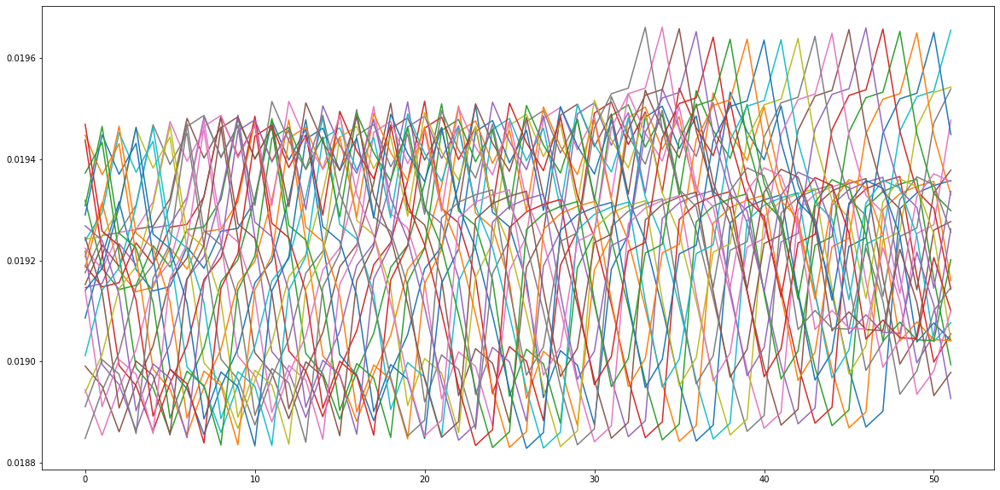

In [207]:
plt.figure(figsize=(20,10))
for timeStepWeek in range(X_valid.shape[0]):
    intermediate_output = intermediate_layer_model.predict(X_valid[timeStepWeek:timeStepWeek+1])
    plt.plot(intermediate_output[0])
    #plt.show()

In [208]:
model_AttentionOut = model  # include here your original model

layer_name = 'attentionFreq_weights'
intermediate_layer_model = Model(inputs=model_AttentionOut.input,
                                 outputs=model_AttentionOut.get_layer(layer_name).output)
intermediate_output = intermediate_layer_model.predict(X_valid[0:1])

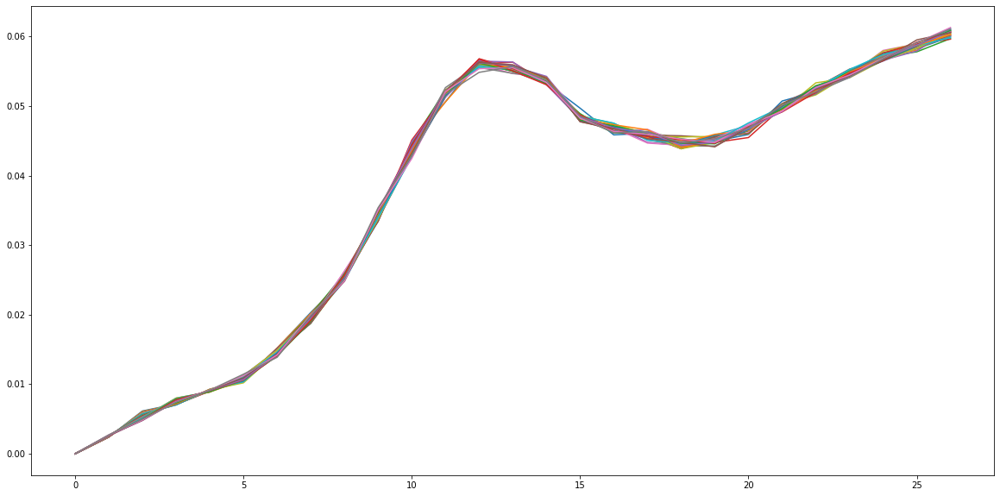

In [209]:
plt.figure(figsize=(20,10))
for timeStepWeek in range(X_valid.shape[0]):
    intermediate_output = intermediate_layer_model.predict(X_valid[timeStepWeek:timeStepWeek+1])
    plt.plot(intermediate_output[0])
    #plt.show()

#### Each head converged to similar pattern to previous independent time and frequency domain mode.

## STFT + Attention

#### STFT calculates the FFT of the 52 week signal in a slidding window. This allows the model to get the information frequency domain values of the input change over time. This gives finer detailed signal to the model.

In [38]:
serie_size, time_step, n_features_row, n_features_column, no_channel = X_train.shape

epochs = 100
lr = .0001
loss='mae'
METRIC_ACCURACY = 'mae'


inputs = Input(shape=(time_step,n_features_row, n_features_column, no_channel))

#Frequency Head
timeDist = TimeDistributed(Flatten())(inputs)
timeDist = Permute([2, 1])(timeDist) #transpose for FFT. FFT library treats the last dimension as time
print('timeDist.shape',timeDist.shape)
window_length = 10 #14,1 #26,1
fftLayer = Lambda(lambda x : tf.math.abs(
    tf.signal.stft(
    x, window_length, 1, fft_length=None,
    window_fn=tf.signal.hamming_window, pad_end=False, name=None
)))(timeDist) ## transform to frequency domain with TF
print('fftLayer.shape',fftLayer.shape)  
fftLayer = tf.reshape(fftLayer, [-1, fftLayer.shape[1] , fftLayer.shape[2] * fftLayer.shape[3]])
fftLayer  = Permute([2, 1], name="fft_out")(fftLayer)#transpose back for the following shape
print('fftLayer.shape',fftLayer.shape)  
#(None,num_of_frequencies,num_of_features)
#compress frequency domain data from 10000 to downsized dimension for attention
#Time distributed is now frequency distributed
timeDist4 = TimeDistributed(Dense(100))(fftLayer)
units = timeDist4.shape[2]

# compute importance for each frequency
attention = Dense(units, activation='tanh')(timeDist4) ## weight matrix W (= units x units)
attention = Dense(1, activation='linear')(attention)     ## weight matrix v (= units x 1)
#attention = Dense(1, activation='tanh')(timeDist4)
attention = Flatten()(attention)
attention = Activation('softmax',name='attention_weights')(attention)
attention = RepeatVector(units)(attention)
attention = Permute([2, 1])(attention)
sent_representation2 = Multiply()([timeDist4, attention])
#For each timestep update a single weight on Dense layer
attended_Dense_out2 = TimeDistributed(Dense(3, activation='relu'))(sent_representation2)
#attended_Dense_out2 = Lambda(lambda x : K.sum(x, axis=1))(sent_representation2) ## this line

#print('attended_Dense_out',attended_Dense_out.shape[1])
#max_len = attended_Dense_out.shape[1]
#pad1 = tf.constant([[0, max_len-attended_Dense_out2.shape[1]]])

#attended_Dense_out2 = tf.pad(attended_Dense_out2, pad1, mode='CONSTANT')

#merge = concatenate([attended_Dense_out, attended_Dense_out2], axis=1)

#Flatten time dimension
Dense2 = Dense(Y_train.shape[1])(Flatten()(attended_Dense_out2))
outputs = Dense2

model = Model(inputs, outputs, name="Attention_STFT")
model.summary()

adam = optimizers.Adam(lr)
#rmsProp = optimizers.RMSprop(learning_rate=lr)
model.compile(loss='mean_absolute_error',
                   metrics=['mae'], 
                   optimizer=adam)

timeDist.shape (None, 10000, 26)
fftLayer.shape (None, 10000, 17, 9)
fftLayer.shape (None, 153, 10000)
Model: "Attention_STFT"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 26, 100, 100 0                                            
__________________________________________________________________________________________________
time_distributed_4 (TimeDistrib (None, 26, 10000)    0           input_3[0][0]                    
__________________________________________________________________________________________________
permute_2 (Permute)             (None, 10000, 26)    0           time_distributed_4[0][0]         
__________________________________________________________________________________________________
lambda_1 (Lambda)               (None, 10000, 17, 9) 0           permute_2[0][0] 

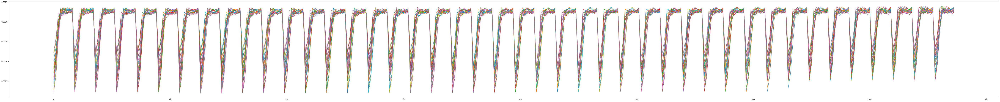

In [83]:
model_AttentionOut = model  # include here your original model

layer_name = 'attention_weights'
intermediate_layer_model = Model(inputs=model_AttentionOut.input,
                                 outputs=model_AttentionOut.get_layer(layer_name).output)
plt.figure(figsize=(100,10))
for timeStepWeek in range(X_valid.shape[0]):
    intermediate_output = intermediate_layer_model.predict(X_valid[timeStepWeek:timeStepWeek+1])
    plt.plot(intermediate_output[0])
    #plt.show()

## FFT + 3 head Attention(Time,FFT,STFT)

In [39]:
serie_size, time_step, n_features_row, n_features_column, no_channel = X_train.shape

epochs = 100
lr = .0001
loss='mae'
METRIC_ACCURACY = 'mae'


inputs = Input(shape=(time_step,n_features_row, n_features_column, no_channel))

#Time Head
timeDist = TimeDistributed(Flatten())(inputs)
timeDist2 = TimeDistributed(Dense(100))(timeDist)
units = timeDist2.shape[2]
# compute importance for each stepattended_LSTM_out
attention = Dense(units, activation='tanh')(timeDist2) ## weight matrix W (= units x units)
attention = Dense(1, activation='linear')(attention)     ## weight matrix v (= units x 1)
#attention = Dense(1, activation='tanh')(timeDist2)
print('attention.shape: ', attention.shape)
attention = Flatten()(attention)
attention = Activation('softmax',name='attention1_weights')(attention)
attention = RepeatVector(units)(attention)
attention = Permute([2, 1])(attention)
sent_representation = Multiply()([timeDist2, attention])
#For each timestep update a single weight on Dense layer
attended_Dense_out = TimeDistributed(Dense(3, activation='relu'))(sent_representation)
#attended_Dense_out = Lambda(lambda x : K.sum(x, axis=1))(sent_representation) ## this line

#Frequency Head Magnitude
timeDist3 = TimeDistributed(Flatten())(inputs)
timeDist3 = Permute([2, 1])(timeDist3) #transpose for FFT. FFT library treats the last dimension as time
print('timeDist3.shape',timeDist3.shape)
fftLayer = Lambda(lambda x : tf.math.abs(tf.signal.rfft(x)))(timeDist3) ## transform to frequency domain with TF
fftLayer  = Permute([2, 1])(fftLayer )#transpose back for the following shape
print('fftLayer.shape',fftLayer.shape)  
#(None,num_of_frequencies,num_of_features)
#compress frequency domain data from 10000 to downsized dimension for attention
#Time distributed is now frequency distributed
timeDist4 = TimeDistributed(Dense(100))(fftLayer)
units = timeDist4.shape[2]

# compute importance for each frequency
attention2 = Dense(units, activation='tanh')(timeDist4) ## weight matrix W (= units x units)
attention2 = Dense(1, activation='linear')(attention2)     ## weight matrix v (= units x 1)
#attention2 = Dense(1, activation='tanh')(timeDist4)
attention2 = Flatten()(attention2)
attention2 = Activation('softmax',name='attention2_weights')(attention2)
attention2 = RepeatVector(units)(attention2)
attention2 = Permute([2, 1])(attention2)
sent_representation2 = Multiply()([timeDist4, attention2])
#For each timestep update a single weight on Dense layer
attended_Dense_out2 = TimeDistributed(Dense(3, activation='relu'))(sent_representation2)
#attended_Dense_out2 = Lambda(lambda x : K.sum(x, axis=1))(sent_representation2) ## this line

#Frequency Head STFT
timeDist5 = TimeDistributed(Flatten())(inputs)
timeDist5 = Permute([2, 1])(timeDist5) #transpose for FFT. FFT library treats the last dimension as time
print('timeDist5.shape',timeDist5.shape)
window_length = 26
fftLayer2 = Lambda(lambda x : tf.math.abs(
    tf.signal.stft(
        x, window_length, 1, fft_length=None,
        window_fn=tf.signal.hann_window, pad_end=False, name=None
)))(timeDist5) ## transform to frequency domain with TF(timeDist5) ## transform to frequency domain with TF
fftLayer2 = tf.reshape(fftLayer2, [-1, fftLayer2.shape[1] , fftLayer2.shape[2] * fftLayer2.shape[3]])
fftLayer2  = Permute([2, 1])(fftLayer2)#transpose back for the following shape
print('fftLayer2.shape',fftLayer2.shape)  
#(None,num_of_frequencies,num_of_features)
#compress frequency domain data from 10000 to downsized dimension for attention
#Time distributed is now frequency distributed
timeDist6 = TimeDistributed(Dense(100))(fftLayer2)
units = timeDist6.shape[2]

# compute importance for each frequency
attention3 = Dense(units, activation='tanh')(timeDist6) ## weight matrix W (= units x units)
attention3 = Dense(1, activation='linear')(attention3)     ## weight matrix v (= units x 1)
#attention3 = Dense(1, activation='tanh')(timeDist6)
attention3 = Flatten()(attention3)
attention3 = Activation('softmax',name='attention3_weights')(attention3)
attention3 = RepeatVector(units)(attention3)
attention3 = Permute([2, 1])(attention3)
sent_representation3 = Multiply()([timeDist6, attention3])
#For each timestep update a single weight on Dense layer
attended_Dense_out3 = TimeDistributed(Dense(3, activation='relu'))(sent_representation3)
#attended_Dense_out3 = Lambda(lambda x : K.sum(x, axis=1))(sent_representation3) ## this line

#print('attended_Dense_out',attended_Dense_out.shape[1])
#max_len = attended_Dense_out.shape[1]
#pad1 = tf.constant([[0, max_len-attended_Dense_out2.shape[1]]])model_AttentionOut = model  # include here your original model

#attended_Dense_out2 = tf.pad(attended_Dense_out2, pad1, mode='CONSTANT')

merge = concatenate([attended_Dense_out, attended_Dense_out2, attended_Dense_out3], axis=1)
#merge = concatenate([attended_Dense_out2, attended_Dense_out3], axis=1)

#Flatten time dimension
Dense2 = Dense(Y_train.shape[1])(Flatten()(merge))
outputs = Dense2

model = Model(inputs, outputs, name="Attention_Time_FFT_STFT")
model.summary()

adam = optimizers.Adam(lr)
model.compile(loss='mean_absolute_error',
                   metrics=['mae'], 
                   optimizer=adam)


attention.shape:  (None, 52, 1)
timeDist3.shape (None, 10000, 52)
fftLayer.shape (None, 27, 10000)
timeDist5.shape (None, 10000, 52)
fftLayer2.shape (None, 459, 10000)
Model: "Attention_Time_FFT_STFT"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 52, 100, 100 0                                            
__________________________________________________________________________________________________
time_distributed_24 (TimeDistri (None, 52, 10000)    0           input_3[0][0]                    
__________________________________________________________________________________________________
time_distributed_21 (TimeDistri (None, 52, 10000)    0           input_3[0][0]                    
__________________________________________________________________________________________________
permute

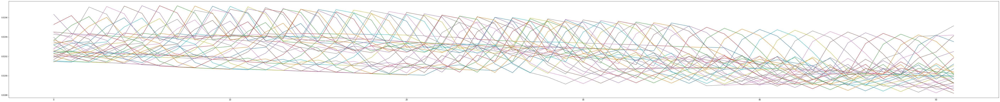

In [47]:
model_AttentionOut = model  # include here your original model

layer_name = 'attention1_weights'
intermediate_layer_model = Model(inputs=model_AttentionOut.input,
                                 outputs=model_AttentionOut.get_layer(layer_name).output)
plt.figure(figsize=(100,10))
for timeStepWeek in range(X_valid.shape[0]):
    intermediate_output = intermediate_layer_model.predict(X_valid[timeStepWeek:timeStepWeek+1])
    plt.plot(intermediate_output[0])
    #plt.show()

## Single Attention on all three heads

In [48]:
serie_size, time_step, n_features_row, n_features_column, no_channel = X_train.shape

epochs = 100
lr = .0001
loss='mae'
METRIC_ACCURACY = 'mae'


inputs = Input(shape=(time_step,n_features_row, n_features_column, no_channel))

#Time Head
timeDist = TimeDistributed(Flatten())(inputs)
timeDist2 = TimeDistributed(Dense(100))(timeDist)
print(timeDist2.shape)

#Frequency Head Magnitude
timeDist3 = TimeDistributed(Flatten())(inputs)
timeDist3 = Permute([2, 1])(timeDist3) #transpose for FFT. FFT library treats the last dimension as time
print('timeDist3.shape',timeDist3.shape)
fftLayer = Lambda(lambda x : tf.math.abs(tf.signal.rfft(x)))(timeDist3) ## transform to frequency domain with TF
fftLayer  = Permute([2, 1])(fftLayer )#transpose back for the following shape
print('fftLayer.shape',fftLayer.shape)  
#(None,num_of_frequencies,num_of_features)
#compress frequency domain data from 10000 to downsized dimension for attention
#Time distributed is now frequency distributed
timeDist4 = TimeDistributed(Dense(100))(fftLayer)
print(timeDist4.shape)

#Frequency Head STFT
timeDist5 = TimeDistributed(Flatten())(inputs)
timeDist5 = Permute([2, 1])(timeDist5) #transpose for FFT. FFT library treats the last dimension as time
print('timeDist5.shape',timeDist5.shape)
window_length = 52 - 10
fftLayer2 = Lambda(lambda x : tf.math.abs(
    tf.signal.stft(
        x, window_length, 1, fft_length=None,
        window_fn=tf.signal.hann_window, pad_end=False, name=None
)))(timeDist5) ## transform to frequency domain with TF(timeDist5) ## transform to frequency domain with TF
fftLayer2 = tf.reshape(fftLayer2, [-1, fftLayer2.shape[1] , fftLayer2.shape[2] * fftLayer2.shape[3]])
fftLayer2  = Permute([2, 1])(fftLayer2)#transpose back for the following shape
print('fftLayer2.shape',fftLayer2.shape)  
#(None,num_of_frequencies,num_of_features)
#compress frequency domain data from 10000 to downsized dimension for attention
#Time distributed is now frequency distributed
timeDist6 = TimeDistributed(Dense(100))(fftLayer2)
print(timeDist6.shape)

merge = concatenate([timeDist2, timeDist4, timeDist6], axis=1)
print(merge.shape)
units = merge.shape[2]

# compute importance for each stepattended_LSTM_out
attention = Dense(units, activation='tanh')(merge) ## weight matrix W (= units x units)
attention = Dense(1, activation='linear')(attention)     ## weight matrix v (= units x 1)
#attention = Dense(1, activation='tanh')(timeDist2)
print('attention.shape: ', attention.shape)
attention = Flatten()(attention)
attention = Activation('softmax',name='attention_weights')(attention)
attention = RepeatVector(units)(attention)
attention = Permute([2, 1])(attention)
sent_representation = Multiply()([merge, attention])
#For each timestep update a single weight on Dense layer
attended_Dense_out = TimeDistributed(Dense(10, activation='relu'))(sent_representation)
#attended_Dense_out = Lambda(lambda x : K.sum(x, axis=1))(sent_representation) ## this line

#Flatten time dimension
Dense2 = Dense(Y_train.shape[1])(Flatten()(attended_Dense_out))
outputs = Dense2

model = Model(inputs, outputs, name="Attention_Time_FFT_STFT")
model.summary()

adam = optimizers.Adam(lr)
model.compile(loss='mean_absolute_error',
                   metrics=['mae'], 
                   optimizer=adam)


(None, 52, 100)
timeDist3.shape (None, 10000, 52)
fftLayer.shape (None, 27, 10000)
(None, 27, 100)
timeDist5.shape (None, 10000, 52)
fftLayer2.shape (None, 363, 10000)
(None, 363, 100)
(None, 442, 100)
attention.shape:  (None, 442, 1)
Model: "Attention_Time_FFT_STFT"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 52, 100, 100 0                                            
__________________________________________________________________________________________________
time_distributed_31 (TimeDistri (None, 52, 10000)    0           input_4[0][0]                    
__________________________________________________________________________________________________
time_distributed_29 (TimeDistri (None, 52, 10000)    0           input_4[0][0]                    
_______________________________________

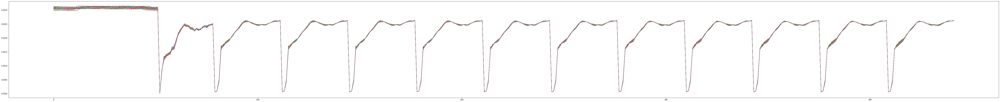

In [51]:
model_AttentionOut = model  # include here your original model

layer_name = 'attention_weights'
intermediate_layer_model = Model(inputs=model_AttentionOut.input,
                                 outputs=model_AttentionOut.get_layer(layer_name).output)
plt.figure(figsize=(100,10))
for timeStepWeek in range(X_valid.shape[0]):
    intermediate_output = intermediate_layer_model.predict(X_valid[timeStepWeek:timeStepWeek+1])
    plt.plot(intermediate_output[0])
    #plt.show()

#### We see after training that the model did pay equal attention to time domain information and the peaks of frequency domain information. In fact, we see the Short time Fourier Transformation has the peak attention across time domain

## Attention with different STFT window size

In [114]:
serie_size, time_step, n_features_row, n_features_column, no_channel = X_train.shape

epochs = 100
lr = .0001
loss='mae'
METRIC_ACCURACY = 'mae'


inputs = Input(shape=(time_step,n_features_row, n_features_column, no_channel))

#Frequency Head STFT
timeDist = TimeDistributed(Flatten())(inputs)
timeDist = Permute([2, 1])(timeDist) #transpose for FFT. FFT library treats the last dimension as time
print('timeDist.shape',timeDist.shape)
window_length0 = 12
fftLayer0 = Lambda(lambda x : tf.math.abs(
    tf.signal.stft(
        x, window_length0, 6, fft_length=None,
        window_fn=tf.signal.hann_window, pad_end=False, name=None
)))(timeDist) ## transform to frequency domain with TF(timeDist) ## transform to frequency domain with TF
print("fftLayer0.shape",fftLayer0.shape)
fftLayer0 = Reshape( ( fftLayer0.shape[1] , fftLayer0.shape[2] * fftLayer0.shape[3]))(fftLayer0)
fftLayer0  = Permute([2, 1])(fftLayer0)#transpose back for the following shape
#print('fftLayer0.shape',fftLayer0.shape)  
#(None,num_of_frequencies,num_of_features)
#compress frequency domain data from 10000 to downsized dimension for attention
#Time distributed is now frequency distributed
timeDist2 = TimeDistributed(Dense(100))(fftLayer0)
print(timeDist2.shape)

#Frequency Head STFT
timeDist3 = TimeDistributed(Flatten())(inputs)
timeDist3 = Permute([2, 1])(timeDist3) #transpose for FFT. FFT library treats the last dimension as time
print('timeDist3.shape',timeDist3.shape)
window_length1 = 20
fftLayer1 = Lambda(lambda x : tf.math.abs(
    tf.signal.stft(
        x, window_length1, 10, fft_length=None,
        window_fn=tf.signal.hann_window, pad_end=False, name=None
)))(timeDist3) ## transform to frequency domain with TF(timeDist3) ## transform to frequency domain with TF
print('fftLayer1.shape',fftLayer1.shape) 
fftLayer1 = Reshape((fftLayer1.shape[1] , fftLayer1.shape[2] * fftLayer1.shape[3]))(fftLayer1)
fftLayer1  = Permute([2, 1])(fftLayer1)#transpose back for the following shape
#print('fftLayer1.shape',fftLayer1.shape)  
#(None,num_of_frequencies,num_of_features)
#compress frequency domain data from 10000 to downsized dimension for attention
#Time distributed is now frequency distributed
timeDist4 = TimeDistributed(Dense(100))(fftLayer1)
print(timeDist4.shape)

#Frequency Head STFT
timeDist5 = TimeDistributed(Flatten())(inputs)
timeDist5 = Permute([2, 1])(timeDist5) #transpose for FFT. FFT library treats the last dimension as time
print('timeDist5.shape',timeDist5.shape)
window_length2 = 33
fftLayer2 = Lambda(lambda x : tf.math.abs(
    tf.signal.stft(
        x, window_length2, 2, fft_length=None,
        window_fn=tf.signal.hann_window, pad_end=False, name=None
)))(timeDist5) ## transform to frequency domain with TF(timeDist5) ## transform to frequency domain with TF
print("fftLayer2.shape",fftLayer2.shape)
fftLayer2 = Reshape((fftLayer2.shape[1] , fftLayer2.shape[2] * fftLayer2.shape[3]))(fftLayer2)
fftLayer2  = Permute([2, 1])(fftLayer2)#transpose back for the following shape
#print('fftLayer2.shape',fftLayer2.shape)  
#(None,num_of_frequencies,num_of_features)
#compress frequency domain data from 10000 to downsized dimension for attention
#Time distributed is now frequency distributed
timeDist6 = TimeDistributed(Dense(100))(fftLayer2)
print(timeDist6.shape)

merge = concatenate([ timeDist2, timeDist4, timeDist6], axis=1)
print(merge.shape)
units = merge.shape[2]

# compute importance for each stepattended_LSTM_out
attention = Dense(units, activation='tanh')(merge) ## weight matrix W (= units x units)
attention = Dense(1, activation='linear')(attention)     ## weight matrix v (= units x 1)
#attention = Dense(1, activation='tanh')(timeDist2)
print('attention.shape: ', attention.shape)
attention = Flatten()(attention)
attention = Activation('softmax',name='attention_weights')(attention)
attention = RepeatVector(units)(attention)
attention = Permute([2, 1])(attention)
sent_representation = Multiply()([merge, attention])
#For each timestep update a single weight on Dense layer
attended_Dense_out = TimeDistributed(Dense(6, activation='relu'))(sent_representation)
#attended_Dense_out = Lambda(lambda x : K.sum(x, axis=1))(sent_representation) ## this line

#Flatten time dimension
Dense2 = Dense(Y_train.shape[1])(Flatten()(attended_Dense_out))
outputs = Dense2

model = Model(inputs, outputs, name="Attention_3xSTFT")
model.summary()

adam = optimizers.Adam(lr)
model.compile(loss='mean_absolute_error',
                   metrics=['mae'], 
                   optimizer=adam)


timeDist.shape (None, 10000, 52)
fftLayer0.shape (None, 10000, 7, 9)
(None, 63, 100)
timeDist3.shape (None, 10000, 52)
fftLayer1.shape (None, 10000, 4, 17)
(None, 68, 100)
timeDist5.shape (None, 10000, 52)
fftLayer2.shape (None, 10000, 10, 33)
(None, 330, 100)
(None, 461, 100)
attention.shape:  (None, 461, 1)
Model: "Attention_3xSTFT"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_23 (InputLayer)           [(None, 52, 100, 100 0                                            
__________________________________________________________________________________________________
time_distributed_102 (TimeDistr (None, 52, 10000)    0           input_23[0][0]                   
__________________________________________________________________________________________________
time_distributed_104 (TimeDistr (None, 52, 10000)    0           inpu

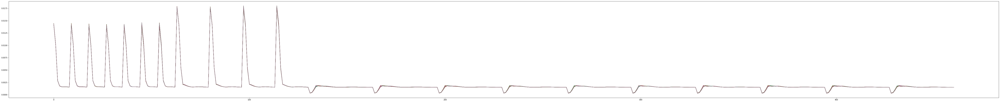

In [117]:
model_AttentionOut = model  # include here your original model

layer_name = 'attention_weights'
intermediate_layer_model = Model(inputs=model_AttentionOut.input,
                                 outputs=model_AttentionOut.get_layer(layer_name).output)
plt.figure(figsize=(100,10))
for timeStepWeek in range(X_valid.shape[0]):
    intermediate_output = intermediate_layer_model.predict(X_valid[timeStepWeek:timeStepWeek+1])
    plt.plot(intermediate_output[0])
    #plt.show()

#### Above plot shows three different sliding windows in time each transforming time series to frequency domain. The windows are sized differently.

## Run fit on any of the previous model here

In [44]:
EPOCHS = 5

earlystop_callback = tf.keras.callbacks.EarlyStopping(monitor="val_loss",
    min_delta=0,
    patience=EPOCHS*10,
    verbose=1,
    mode="auto",
    baseline=None,
    restore_best_weights=True,)

logdir = os.path.join("./logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_cbk = tf.keras.callbacks.TensorBoard(log_dir=logdir)

modelfilename = checkpoint_filepath + '_'+\
                    datetime.datetime.now().strftime("%Y%m%d-%H%M%S")\
                    + "_model.hdf5"

model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    modelfilename,
    save_weights_only=False,
    monitor='val_loss',#'val_accuracy',
    mode='min',
    verbose=1,
    period = 1,
    save_best_only=True)


model.summary()

model_history = model.fit(X_train,Y_train, 
                             validation_data=(X_valid, Y_valid),
                             epochs=1000, 
                             batch_size=6, 
                             callbacks=[tensorboard_cbk,
                             #hp.KerasCallback(logdir, hparams),
                             earlystop_callback,
                             model_checkpoint_callback
                                       ])

valid_loss, valid_acc = model.evaluate(X_valid, Y_valid, verbose=2) # 5/2020 nt: use validation set
print ("valid_accuracy_MAE=%s, valid_loss=%s" % (valid_acc, valid_loss))

Model: "Attention_FFT"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 52, 100, 100, 1)] 0         
_________________________________________________________________
time_distributed_3 (TimeDist (None, 52, 10000)         0         
_________________________________________________________________
permute_2 (Permute)          (None, 10000, 52)         0         
_________________________________________________________________
lambda_1 (Lambda)            (None, 10000, 27)         0         
_________________________________________________________________
fft_out (Permute)            (None, 27, 10000)         0         
_________________________________________________________________
time_distributed_4 (TimeDist (None, 27, 100)           1000100   
_________________________________________________________________
time_distributed_5 (TimeDist (None, 27, 3)           

84/88 [===========================>..] - ETA: 0s - loss: 0.0016 - mae: 0.0016
Epoch 00024: val_loss did not improve from 0.00170
88/88 [==============================] - 0s 2ms/sample - loss: 0.0016 - mae: 0.0016 - val_loss: 0.0017 - val_mae: 0.0017
Epoch 25/1000
84/88 [===========================>..] - ETA: 0s - loss: 0.0016 - mae: 0.0016
Epoch 00025: val_loss did not improve from 0.00170
88/88 [==============================] - 0s 2ms/sample - loss: 0.0016 - mae: 0.0016 - val_loss: 0.0017 - val_mae: 0.0017
Epoch 26/1000
48/88 [===============>..............] - ETA: 0s - loss: 0.0016 - mae: 0.0016
Epoch 00026: val_loss did not improve from 0.00170
88/88 [==============================] - 0s 2ms/sample - loss: 0.0016 - mae: 0.0016 - val_loss: 0.0017 - val_mae: 0.0017
Epoch 27/1000
84/88 [===========================>..] - ETA: 0s - loss: 0.0016 - mae: 0.0016
Epoch 00027: val_loss did not improve from 0.00170
88/88 [==============================] - 0s 2ms/sample - loss: 0.0016 - mae: 0.

78/88 [=========================>....] - ETA: 0s - loss: 0.0016 - mae: 0.0016Restoring model weights from the end of the best epoch.

Epoch 00055: val_loss did not improve from 0.00170
88/88 [==============================] - 0s 2ms/sample - loss: 0.0016 - mae: 0.0016 - val_loss: 0.0017 - val_mae: 0.0017
Epoch 00055: early stopping
28/28 - 0s - loss: 0.0017 - mae: 0.0017
valid_accuracy_MAE=0.0016988942, valid_loss=0.0016988941933959723


#### Test Set accuracy

#### Flattened+Attention

In [54]:
valid_loss, valid_acc = model.evaluate(X_test, Y_test, verbose=2) # 5/2020 nt: use validation set
print ("valid_accuracy_MAE=%s, valid_loss=%s" % (valid_acc, valid_loss))

28/28 - 0s - loss: 0.0021 - mae: 0.0021
valid_accuracy_MAE=0.002142413, valid_loss=0.002142413053661585


#### Flattened+LSTM+Attention

In [48]:
valid_loss, valid_acc = model.evaluate(X_test, Y_test, verbose=2) # 5/2020 nt: use validation set
print ("valid_accuracy_MAE=%s, valid_loss=%s" % (valid_acc, valid_loss))

28/28 - 0s - loss: 0.0021 - mae: 0.0021
valid_accuracy_MAE=0.0021439143, valid_loss=0.002143914345651865


#### FFT+Attention

In [104]:
valid_loss, valid_acc = model.evaluate(X_test, Y_test, verbose=2) # 5/2020 nt: use validation set
print ("valid_accuracy_MAE=%s, valid_loss=%s" % (valid_acc, valid_loss))

28/28 - 0s - loss: 0.0021 - mae: 0.0021
valid_accuracy_MAE=0.002143551, valid_loss=0.0021435508970171213


#### Adam Optimize:

### Best flatten() + fully connected Dense is at  MAE of 0.001698

### Best flatten() + LSTM(100) is at  MAE of 0.001731

### Best 2D CNN + LSTM(50) is at MAE of 0.001724

### Best 2D CNN + LSTM(100) + Attention on LSTM recurrences is at  MAE of 0.0016917

### Best flatten() + LSTM(100) + Attention on LSTM recurrences is at  MAE of 0.0016915

### Best flatten() + 2x Attention Heads on  TimeDistributed is at MAE of 0.0016920

### Best FFT + Attention Heads on  TimeDistributed is at MAE of 0.0016920

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard
logs_base_dir = "./logs"
os.makedirs(logs_base_dir, exist_ok=True)
%tensorboard --logdir {logs_base_dir}

In [45]:
Predict = model.predict(X_valid)

In [46]:
Predict.shape

(28, 10000)

In [47]:
int(Predict[-1].shape[0]**(1/2)),int(Predict[-1].shape[0]**(1/2))

(100, 100)

In [48]:
def reshapePred(Predict, fromLast=1):
    return np.rot90(Predict[-1*fromLast].reshape(int(Predict[-1*fromLast].shape[0]**(1/2)),int(Predict[-1*fromLast].shape[0]**(1/2))))

In [59]:
Y_valid.shape

(28, 10000)

/home/zhimin90/anaconda3/envs/venv/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  from ipykernel import kernelapp as app
/home/zhimin90/anaconda3/envs/venv/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


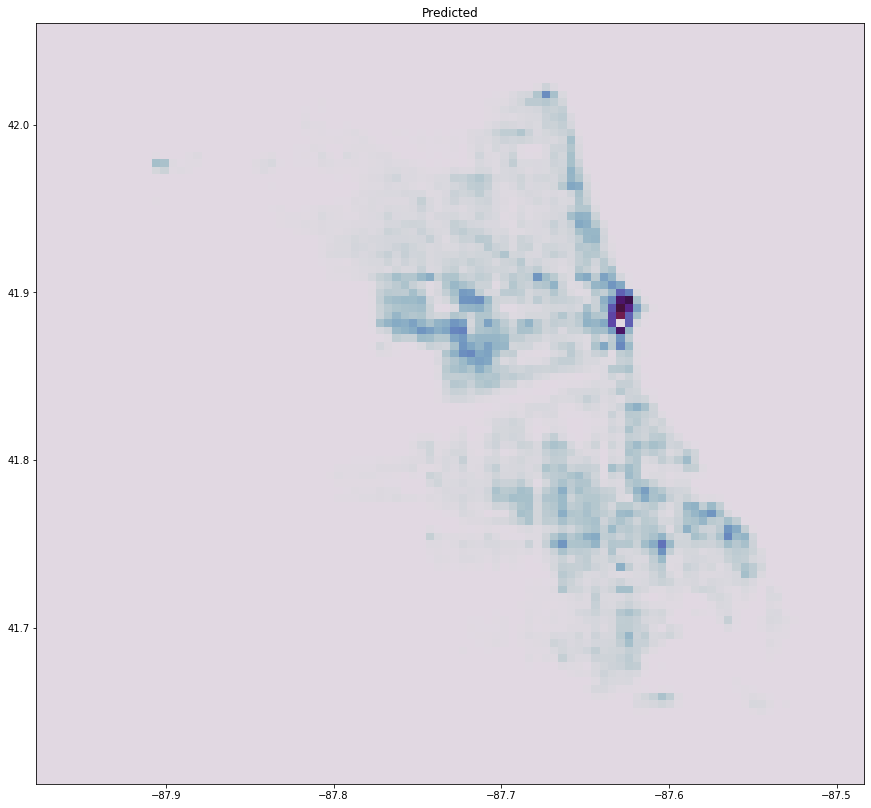

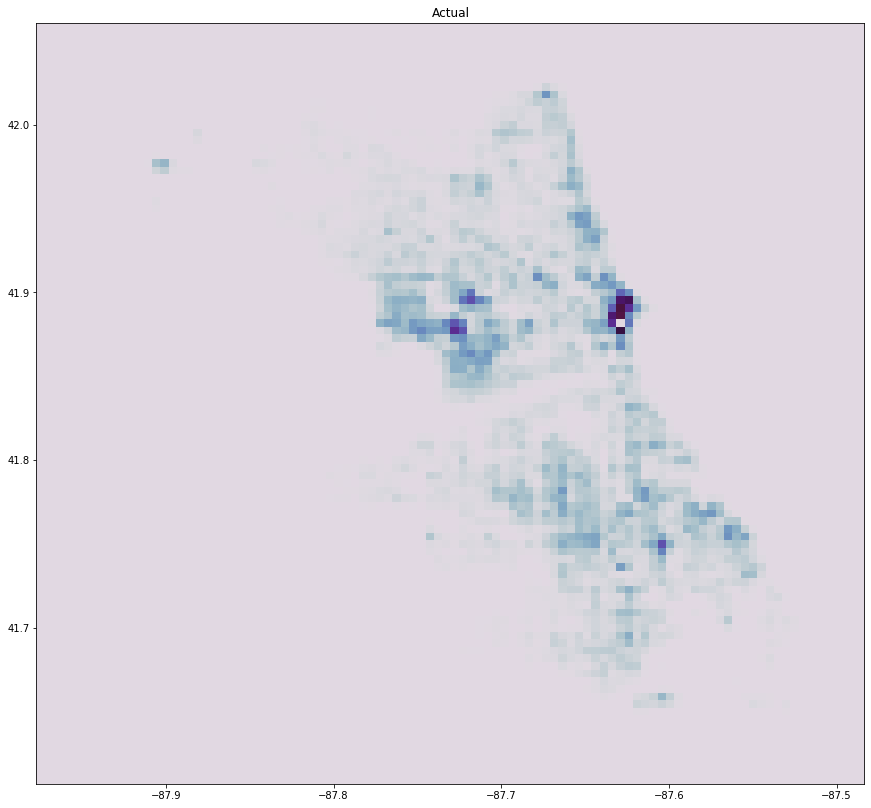

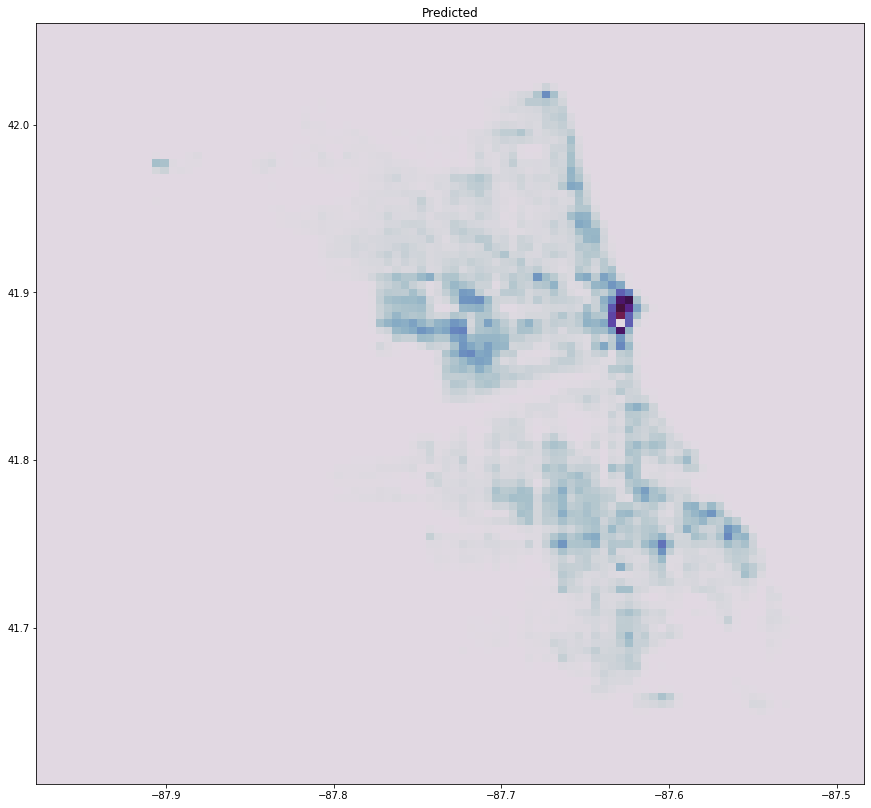

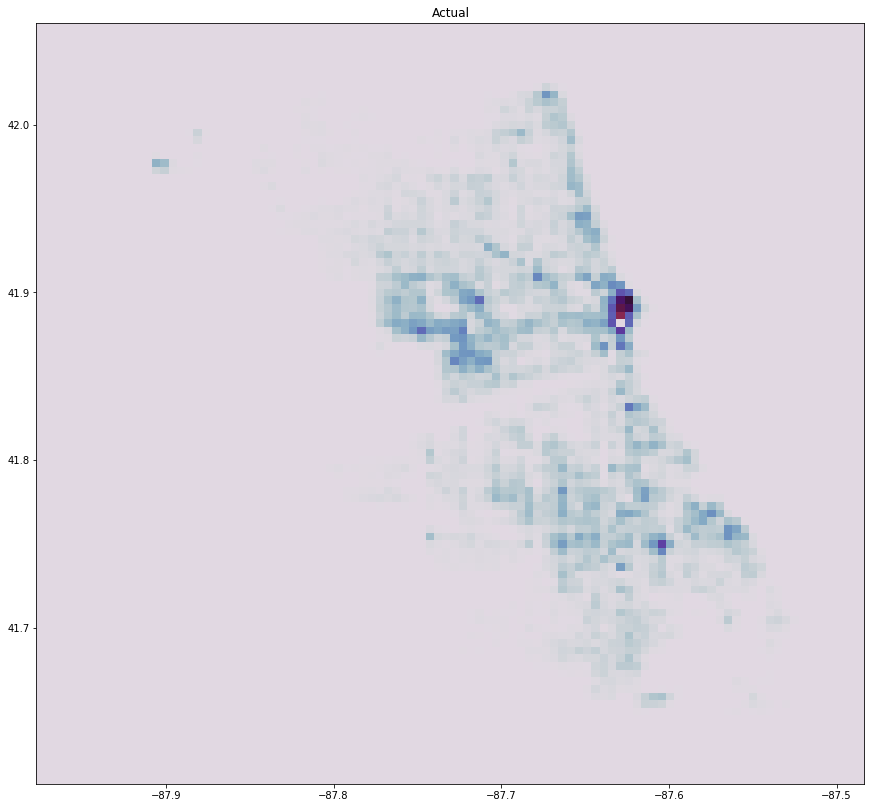

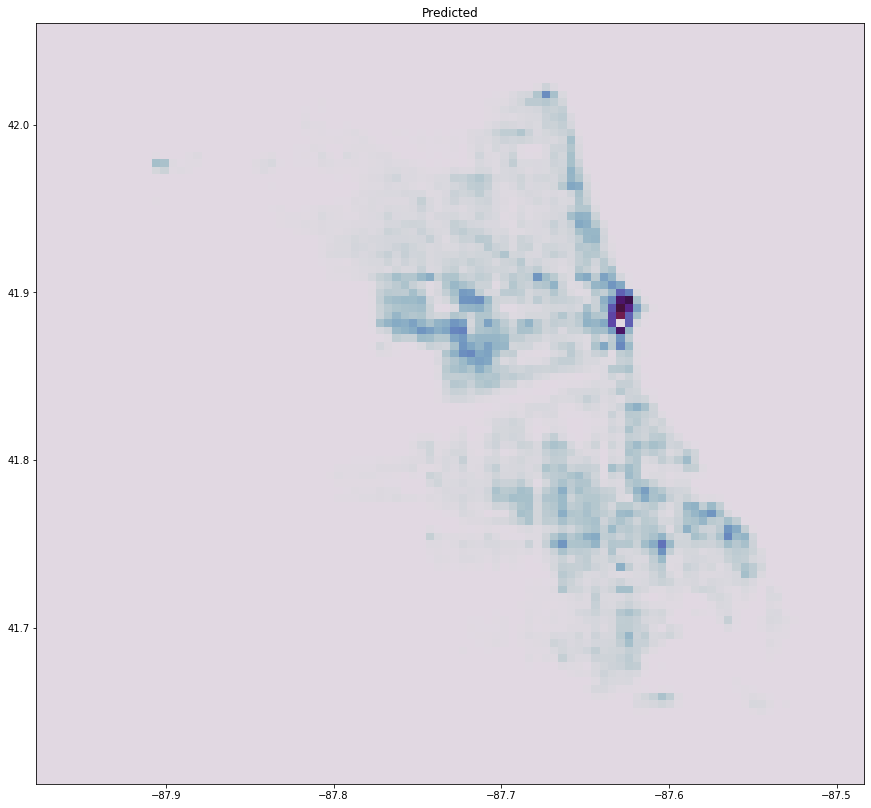

...

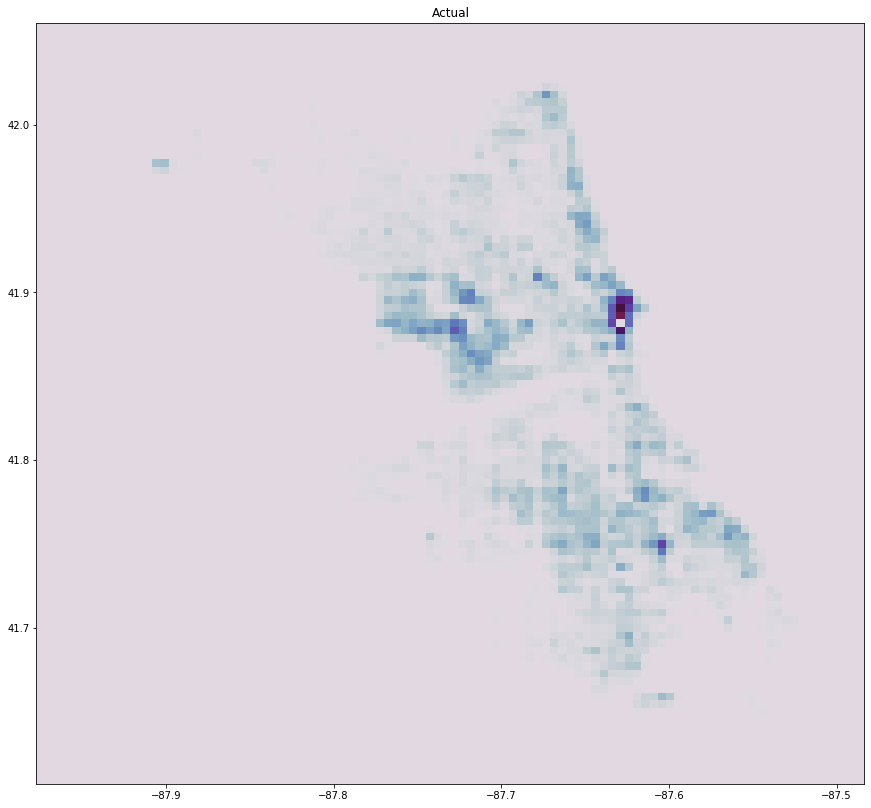

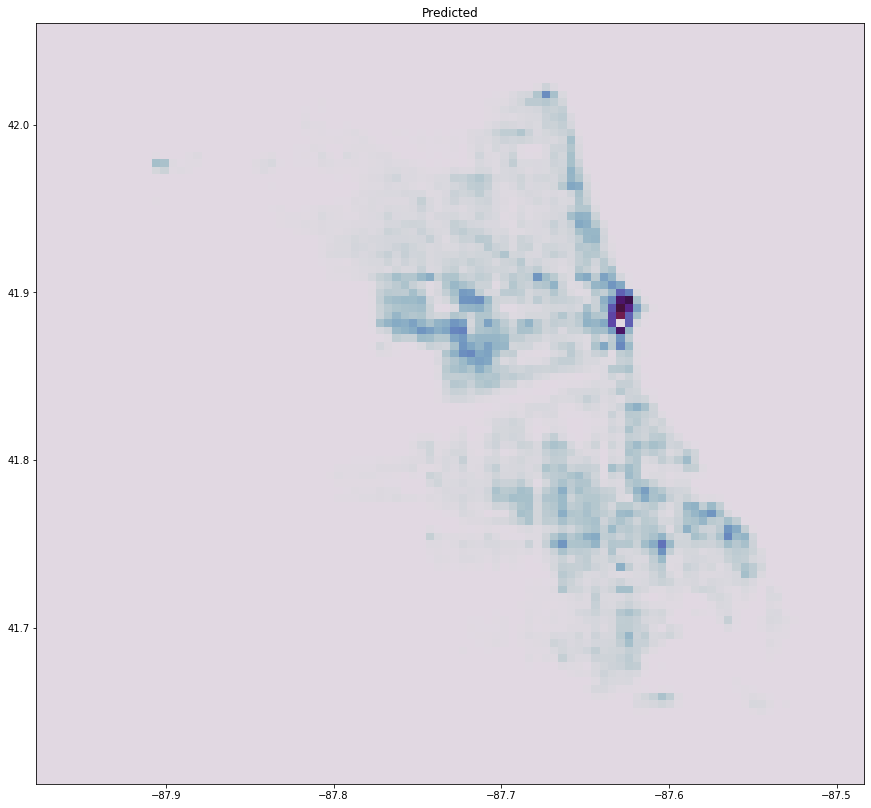

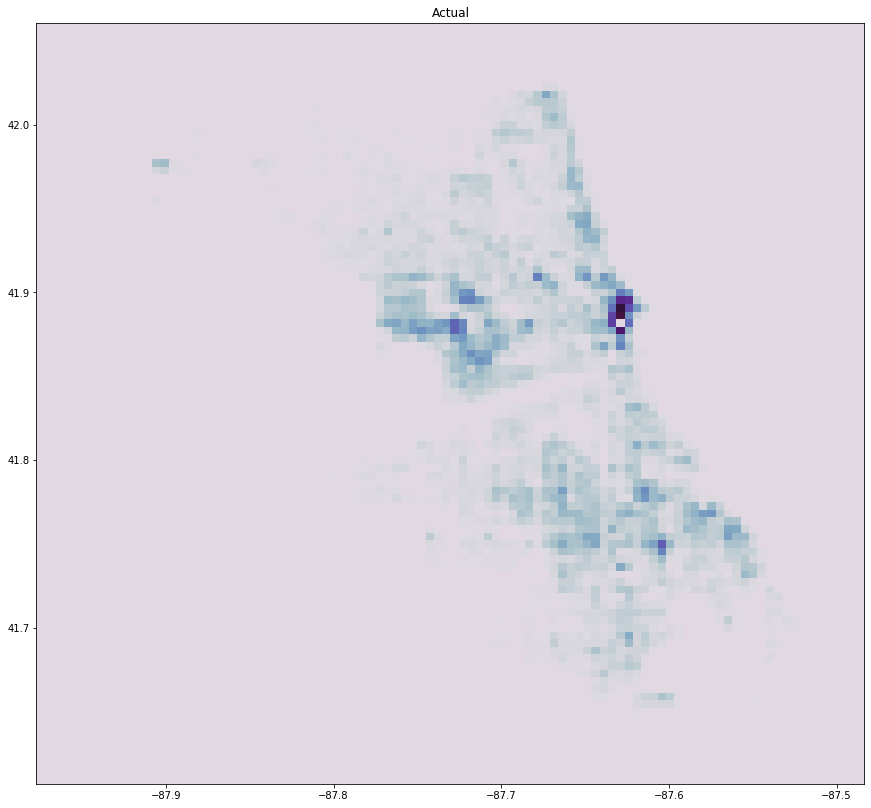

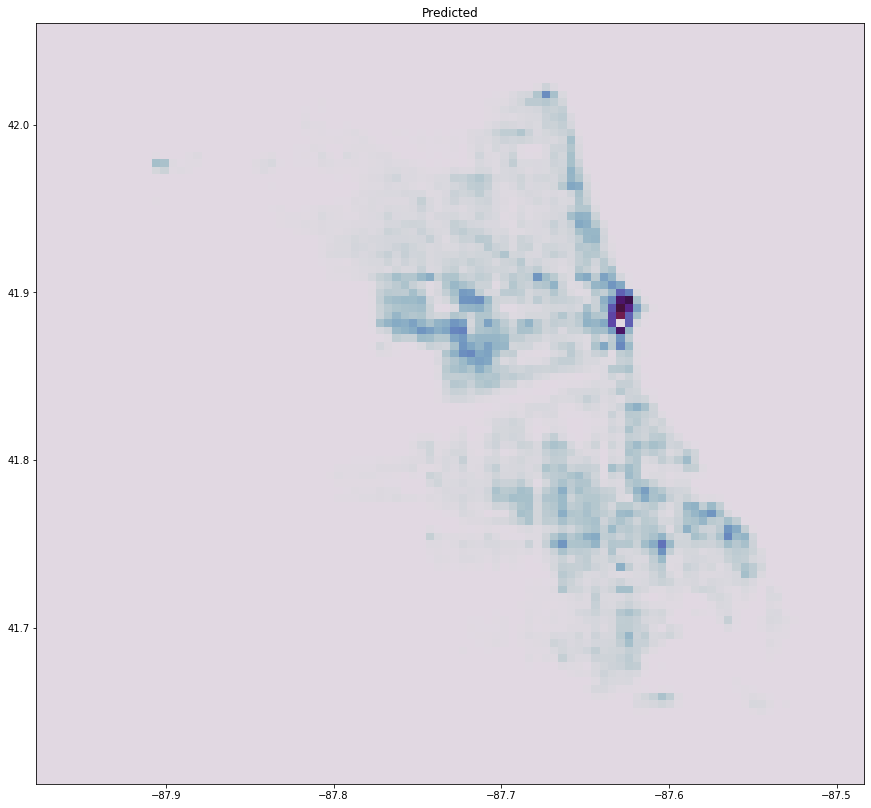

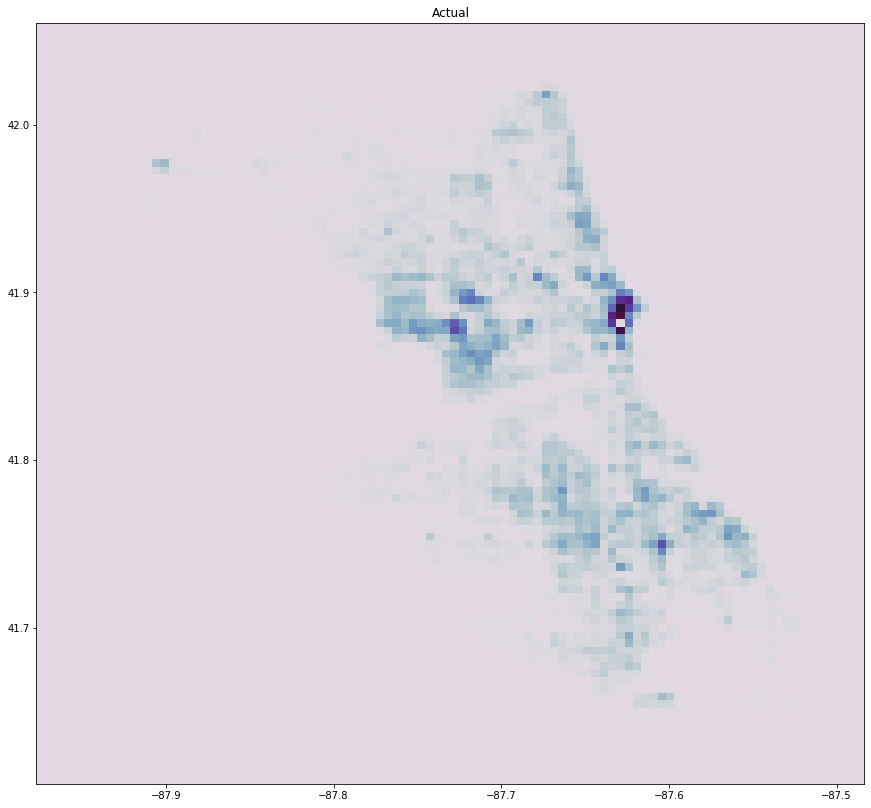

In [60]:
import matplotlib.pyplot as plt
grid_size = 500
density_matrix_t_series = []
# Define the borders
x = [-87.9361,-87.5245]
y = [41.6447,42.023]
deltaX = (max(x) - min(x))/10
deltaY = (max(y) - min(y))/10
xmin = min(x) - deltaX
xmax = max(x) + deltaX
ymin = min(y) - deltaY
ymax = max(y) + deltaY

for timeStepFromLast in range(Y_valid.shape[0]):
    plt.figure(figsize=(18, 14))
    plt.title('Predicted')
    plt.imshow( X=reshapePred(Predict,timeStepFromLast), cmap=plt.cm.twilight, extent=[xmin, xmax, ymin, ymax])

    plt.figure(figsize=(18, 14))
    plt.title('Actual')
    plt.imshow( X=reshapePred(Y_valid,timeStepFromLast ), cmap=plt.cm.twilight, extent=[xmin, xmax, ymin, ymax])

#### We plot the difference between prediction and target

In [51]:
diff = (reshapePred(Y_valid,3)-reshapePred(Predict,3))
diff.shape

(100, 100)

In [52]:
diff_max = np.max(diff)
diff_min = np.min(diff)
scaled_diff = (diff - diff_min)/(diff_max - diff_min)

In [53]:
np.max(scaled_diff)

1.0

In [54]:
diff

array([[-1.40557549e-05,  4.46533795e-06, -2.77445906e-05, ...,
         1.72984655e-05,  2.84408361e-06,  1.60139116e-05],
       [ 1.55286216e-05, -1.22595238e-05,  2.54712177e-05, ...,
        -3.75164927e-06, -1.53048586e-06, -4.03715312e-05],
       [ 3.45113622e-05,  1.30074732e-05,  1.09088924e-05, ...,
         1.82258227e-05,  1.65899182e-05,  6.14444798e-06],
       ...,
       [-1.82730510e-05, -1.86596626e-05,  6.50694756e-06, ...,
         1.11201007e-06, -2.62870344e-06,  1.49729813e-05],
       [-1.95922257e-05, -1.02223057e-05,  1.21394769e-05, ...,
         1.52801713e-05, -1.23859718e-06, -9.52929986e-06],
       [-3.77639162e-06, -3.51259587e-06, -4.74256922e-06, ...,
        -4.22682933e-06,  7.77197784e-07,  2.16859662e-05]])

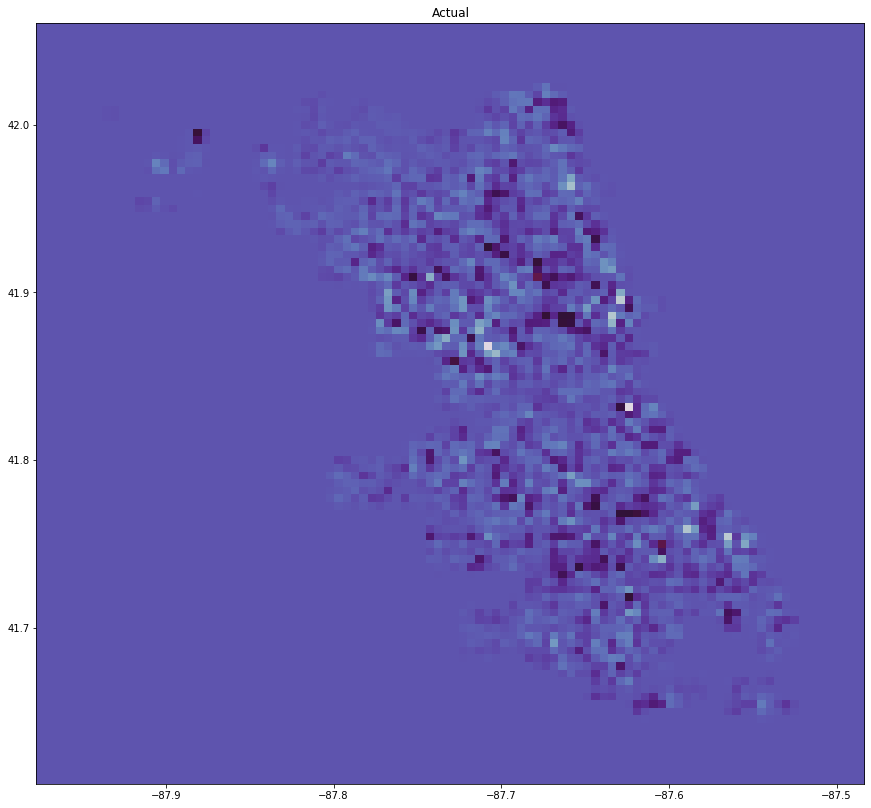

In [55]:
plt.figure(figsize=(18, 14))
plt.title('Actual')
plt.imshow( X=scaled_diff, cmap=plt.cm.twilight, extent=[xmin, xmax, ymin, ymax])

#### Note the differences is scaled, red means extreme differences inplot above. Interestingly we see the extreme differences is at the highest crime areas.